# Trying to refine down/up state definition
6.10.21

In [1]:
import numpy as np
import pyemma
import matplotlib.pyplot as plt
import sys

In [2]:
sys.path.insert(1, "../../python/")
sys.path.insert(1, "../../../")
import util
import kde

In [4]:
plt.style.use("seaborn-ticks")
import seaborn as sns

sns.set_palette("colorblind")

# Load data and cvs

In [5]:
remove = [
    1282,
    1283,
    1284,
    1285,
    1286,
    1288,
    1289,
    1290,
    1187,
    1188,
    1189,
    1190,
    1191,
    1197,
    1198,
    1199,
    1203,
    1205,
    1206,
    1207,
    1211,
    1212,
    1213,
    1214,
    1215,
    1225,
    1226,
    1227,
    1228,
    1231,
    1232,
    1233,
    1236,
    1237,
    1238,
    1242,
    1245,
    1246,
    1252,
    1253,
    1260,
    1261,
    1262,
    1263,
    1266,
    1267,
    1268,
    1269,
    1270,
    1271,
    1272,
    1273,
    1274,
    1275,
    1276,
    1277,
    1278,
    1279,
]

## load CVs 

In [ ]:
with np.load("../../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cv_arr = f["arr_0"]

In [ ]:
livac_trajs = np.load("../../data/sb_ind100_TICA/livac_trajs.npy", allow_pickle=True)
livac_arr = np.concatenate(livac_trajs)
models_km100 = np.load("../../data/sb_ind100_TICA/models.npy", allow_pickle=True)

In [ ]:
orig_traj_lens = [len(traj) for traj in livac_trajs]
orig_traj_inds = []
subtot = 0
for length in orig_traj_lens[:-1]:
    subtot += length
    orig_traj_inds.append(subtot)

In [ ]:
with np.load("../data/raw_feat/ri126_dist.npz", allow_pickle=True) as f:
    ri_trajs = f["arr_0"]
ri_arr = np.concatenate(ri_trajs)
ri_arr.shape

In [ ]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [ ]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    sb_data = f["arr_0"]

In [ ]:
print(len(sb_data))
print(sb_data[0].shape)

In [ ]:
sb_data_arr = np.concatenate(sb_data)
print(sb_data_arr.shape)

In [18]:
cv_arr = np.hstack((cv_arr, sb_data_arr, ri_arr, livac_arr))

In [19]:
cv_arr.shape

(6580000, 72)

In [12]:
cv_trajs = np.split(cv_arr, orig_traj_inds)

In [13]:
for idx in sorted(remove, reverse=True):
    del cv_trajs[idx]

In [14]:
sb_data = list(sb_data)
for idx in sorted(remove, reverse=True):
    del sb_data[idx]

In [15]:
livac_trajs = list(livac_trajs)
for idx in sorted(remove, reverse=True):
    del livac_trajs[idx]

In [16]:
livac_trajs = livac_trajs[1000:]

In [17]:
cv_trajs = cv_trajs[1000:]
sb_data = sb_data[1000:]

In [18]:
sb_data_arr = np.concatenate(sb_data)
livac_arr = np.concatenate(livac_trajs)

In [19]:
livac_arr.shape

(3000000, 5)

In [20]:
cv_arr = np.concatenate(cv_trajs)
print(cv_arr.shape)

(3000000, 2)


### 

In [6]:
livac_trajs = np.load(
    "../../data/sb_ind100_TICA/livac_trajs_anton.npy", allow_pickle=True
)
ri_trajs = np.load("../../data/raw_feat/ri126_dist_anton.npz.npy", allow_pickle=True)
cv_trajs = np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)

In [7]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [8]:
data_trajs = np.load("../../data/raw_feat/feat2_raw_anton.npy", allow_pickle=True)

In [9]:
print(len(livac_trajs), len(ri_trajs), len(data_trajs), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
data_arr = np.concatenate(data_trajs)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, data_arr.shape, cv_arr.shape)

237 237 237 237
(3000000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


# Previous definition 

In [24]:
for i, label in enumerate(sb_labels):
    print(i, label)

0 R217 - D129
1 R217 - D136
2 R217 - D151
3 R217 - D164
4 R217 - E183
5 R217 - D186
6 R223 - D129
7 R223 - D136
8 R223 - D151
9 R223 - D164
10 R223 - E183
11 R223 - D186
12 R226 - D129
13 R226 - D136
14 R226 - D151
15 R226 - D164
16 R226 - E183
17 R226 - D186
18 R229 - D129
19 R229 - D136
20 R229 - D151
21 R229 - D164
22 R229 - E183
23 R229 - D186
24 R232 - D129
25 R232 - D136
26 R232 - D151
27 R232 - D164
28 R232 - E183
29 R232 - D186


In [27]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = cv_arr[:, 14]
sb1 = sb_data_arr[:, 47]  # R2-D186
sb2 = sb_data_arr[:, 53]  # R3-D186
sb3 = sb_data_arr[:, 42]  # R2-D129


# ellipse centered at (-4.174, -50.8) with radii 1.1 nm and 16 deg (2 sigma in each direction) for down state
# take points where TIC 1 < 1.2 and R2/R3-D186 distance < 0.5/0.55 (lower salt bridges)
dist_ax_down = (dist + 4.174) / 1.1
rot_ax_down = (rot + 50.8) / 16
down_ids = (
    ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1)
    & (sb1 < 0.5)
    & (sb2 < 0.55)
    & (sb3 > 0.6)
    & (tic1 < 1.2)
).nonzero()[0]

In [29]:
down_cvs = cv_arr[down_ids]
down_sbs = sb_data_arr[down_ids]

## Plot in SB distance space 

In [9]:
from itertools import combinations

In [10]:
# useful salt bridges
# R226-D129, R229-D129, R226-D186, R229-D186
sb_ids = [42, 48, 47, 53]

In [11]:
feat2_models = np.load("../../data/models_feat2.npy")

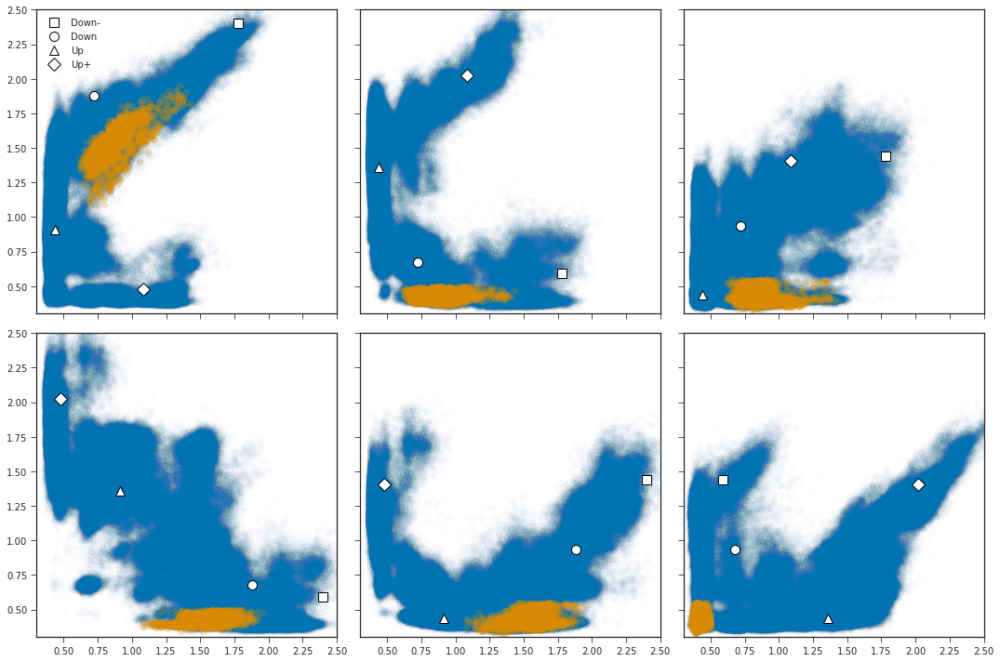

In [36]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_models[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_models[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

## what if no SB cutoffs 

In [37]:
down_ids = (((dist_ax_down ** 2 + rot_ax_down ** 2) < 1) & (tic1 < 1.2)).nonzero()[0]

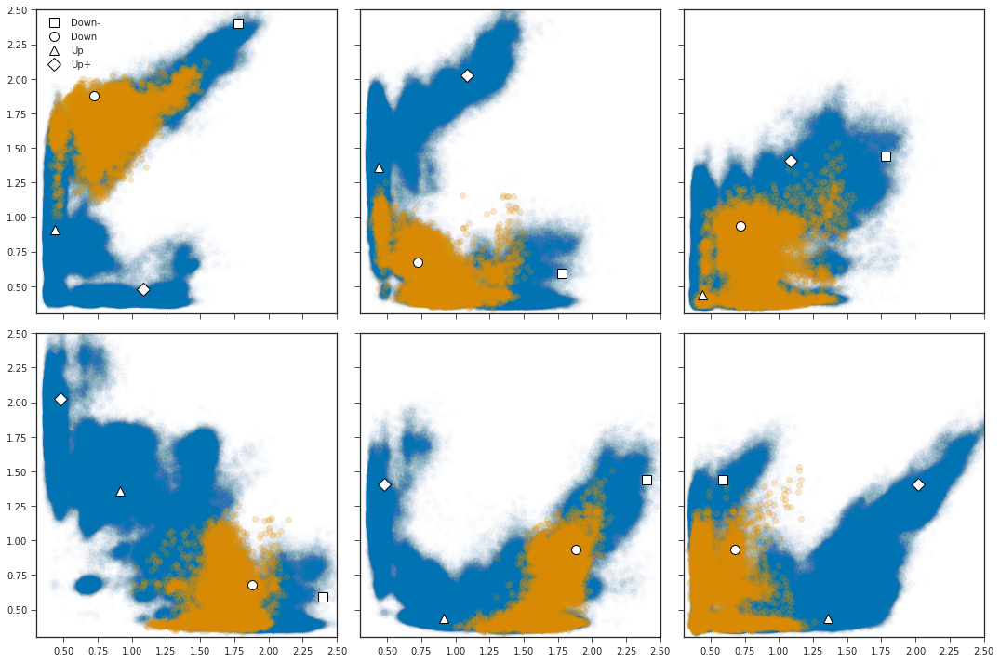

In [38]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_models[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_models[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

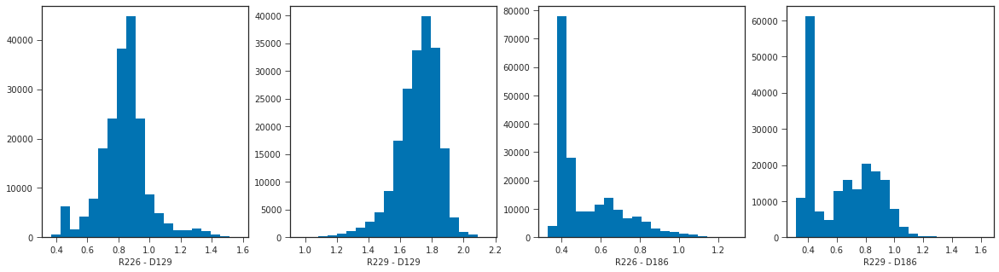

In [42]:
# only distance and rotation cutoffs
f, axs = plt.subplots(1, 4, figsize=(20, 5))
for idx, ax in zip(sb_ids, axs):
    ax.hist(down_sbs[:, idx], bins=20)
    ax.set_xlabel(sb_labels[idx - 30])

What to do about large distribution of R229-D186 ? the MD centroid shows R229 pointed away and down d~0.8 nm, but my thought is that it probably depends on the transition whether to

In [45]:
sb1 = sb_data_arr[:, sb_ids[0]]  # R2-D129
sb2 = sb_data_arr[:, sb_ids[1]]  # R3-D129
sb3 = sb_data_arr[:, sb_ids[2]]  # R2-D186
sb4 = sb_data_arr[:, sb_ids[3]]  # R3-D186
# different version
down_ids = (
    ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1)
    & (sb1 > 0.6)
    & (sb1 < 1.2)
    & (sb2 > 1.45)
    & (sb3 > 0.6)
    & (sb4 > 0.55)
    & (tic1 < 1.2)
).nonzero()[0]

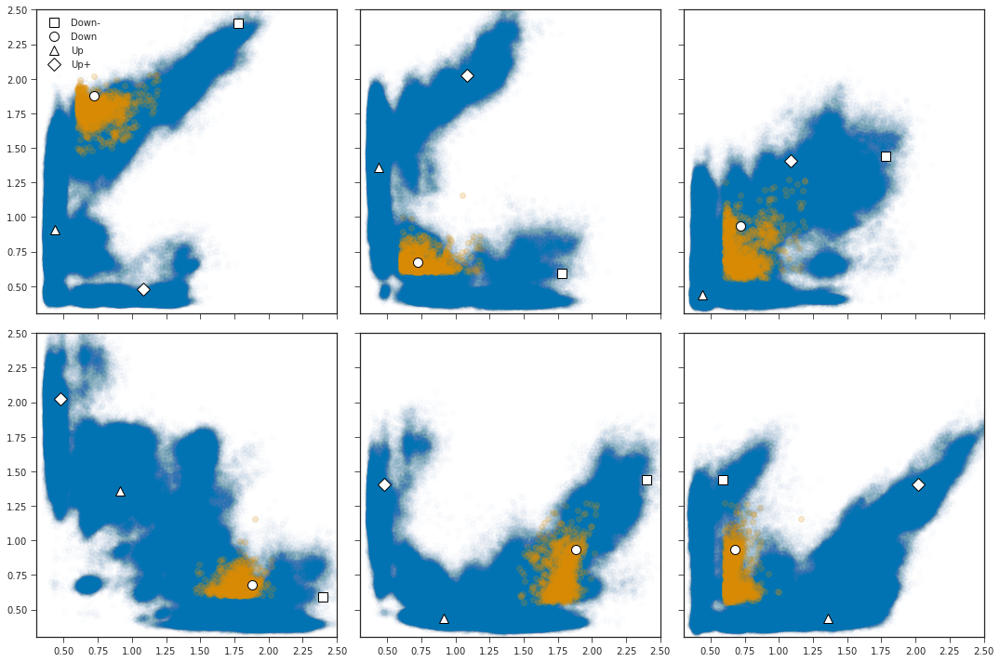

In [46]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_models[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_models[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [26]:
# salt bridges that would be good for down- to down transition (just shifted up by one arginine)
# R223-D129, R226-D129, R223-D186, R226-D186
sb_ids_dd = [36, 42, 41, 47]

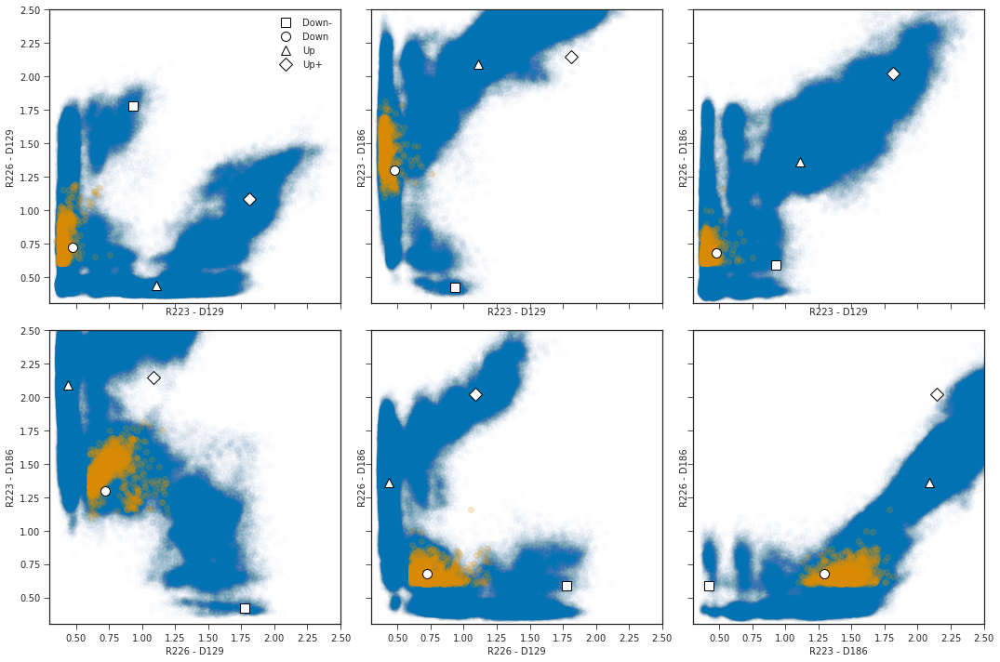

In [50]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_dd, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 36:43:6])  # indexes 36 and 42
util.plot_models(axes[0][1], feat2_models[:, 36:42:5])  # 36 and 41
util.plot_models(axes[0][2], feat2_models[:, 36:48:11])  # 36 and 47
util.plot_models(axes[1][0], feat2_models[:, 42:40:-1])  # indexes 42 and 41
util.plot_models(axes[1][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[1][2], feat2_models[:, 41:48:6])  # 41 and 47
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [33]:
# load centroid models
feat2_centroids = np.load("../../data/models_centroids_feat2.npy")

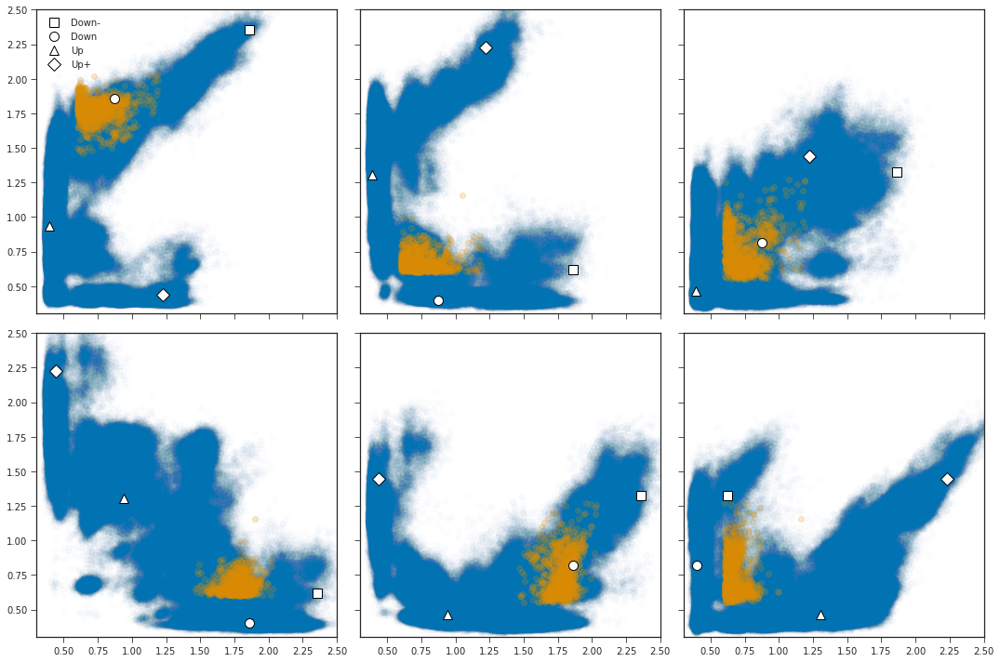

In [52]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

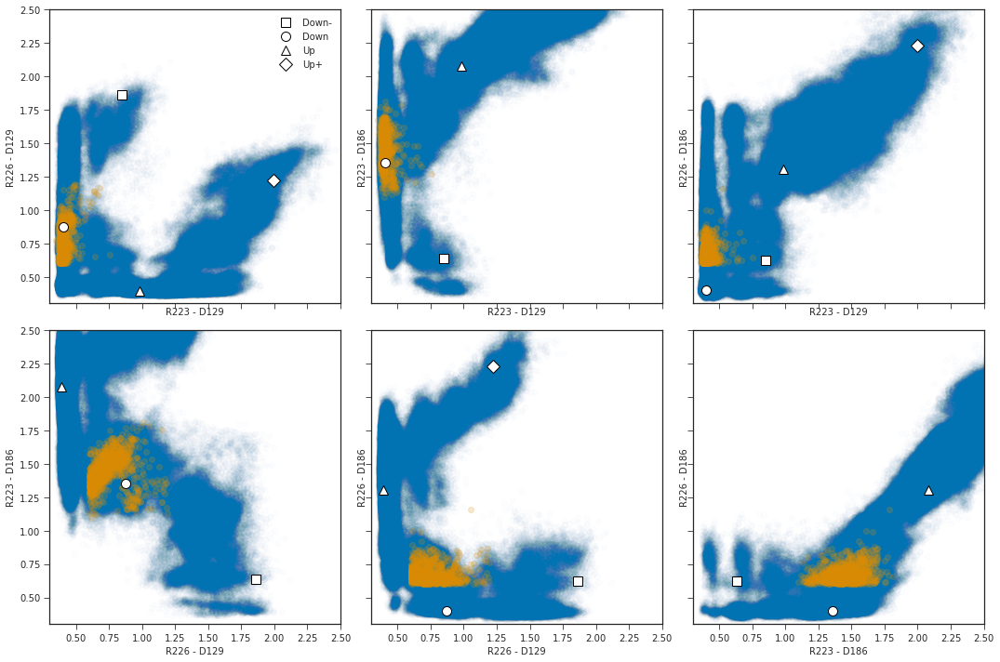

In [53]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_dd, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 36:43:6])  # indexes 36 and 42
util.plot_models(axes[0][1], feat2_centroids[:, 36:42:5])  # 36 and 41
util.plot_models(axes[0][2], feat2_centroids[:, 36:48:11])  # 36 and 47
util.plot_models(axes[1][0], feat2_centroids[:, 42:40:-1])  # indexes 42 and 41
util.plot_models(axes[1][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[1][2], feat2_centroids[:, 41:48:6])  # 41 and 47
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

## Try downstate with centroid as center 

In [22]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
sb1 = sb_data_arr[:, 47]  # R2-D186
sb2 = sb_data_arr[:, 53]  # R3-D186
sb3 = sb_data_arr[:, 42]  # R2-D129


# ellipse centered at (-4.174, -50.8) with radii 1.1 nm and 16 deg (2 sigma in each direction) for down state
# take points where TIC 1 < 1.2 and R2/R3-D186 distance < 0.5/0.55 (lower salt bridges)
dist_ax_down = (dist + 4.240) / 1.1
rot_ax_down = (rot + 56.95) / 16
down_ids = (
    ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1)
    & (sb1 < 0.5)
    & (sb2 < 0.55)
    & (sb3 > 0.6)
    & (tic1 < 1.2)
).nonzero()[0]

In [23]:
down_cvs = cv_arr[down_ids]
down_sbs = sb_data_arr[down_ids]

In [24]:
print(len(down_cvs))

8810


## Plot in SB distance space 

In [25]:
from itertools import combinations

In [26]:
# useful salt bridges
# R226-D129, R229-D129, R226-D186, R229-D186
sb_ids = [42, 48, 47, 53]

In [27]:
feat2_models = np.load("../../data/models_feat2.npy")

In [28]:
feat2_centroids = np.load("../../data/models_centroids_feat2.npy")

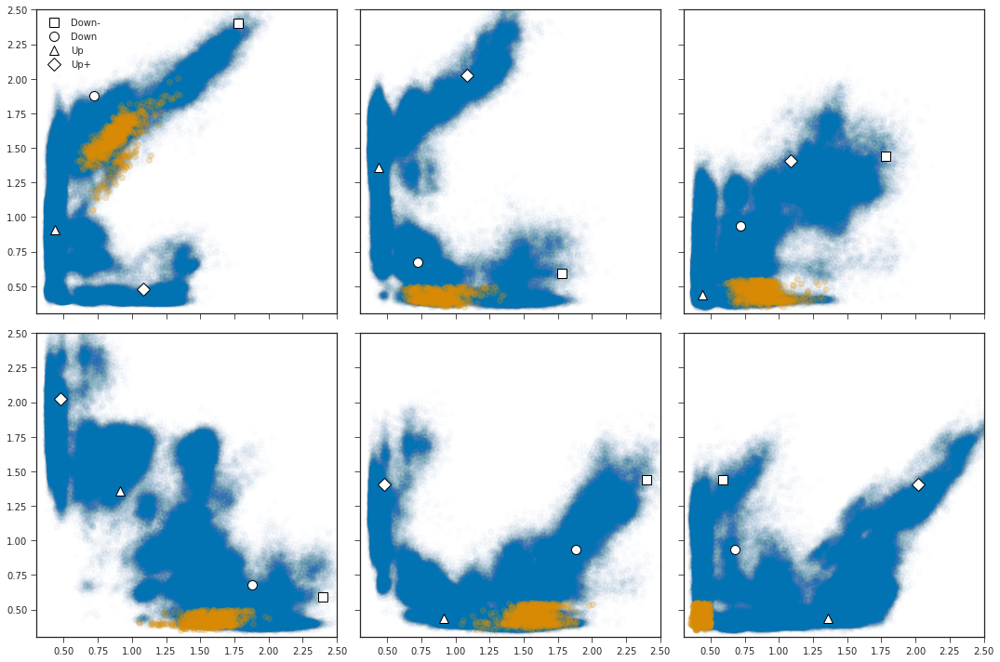

In [29]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_models[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_models[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

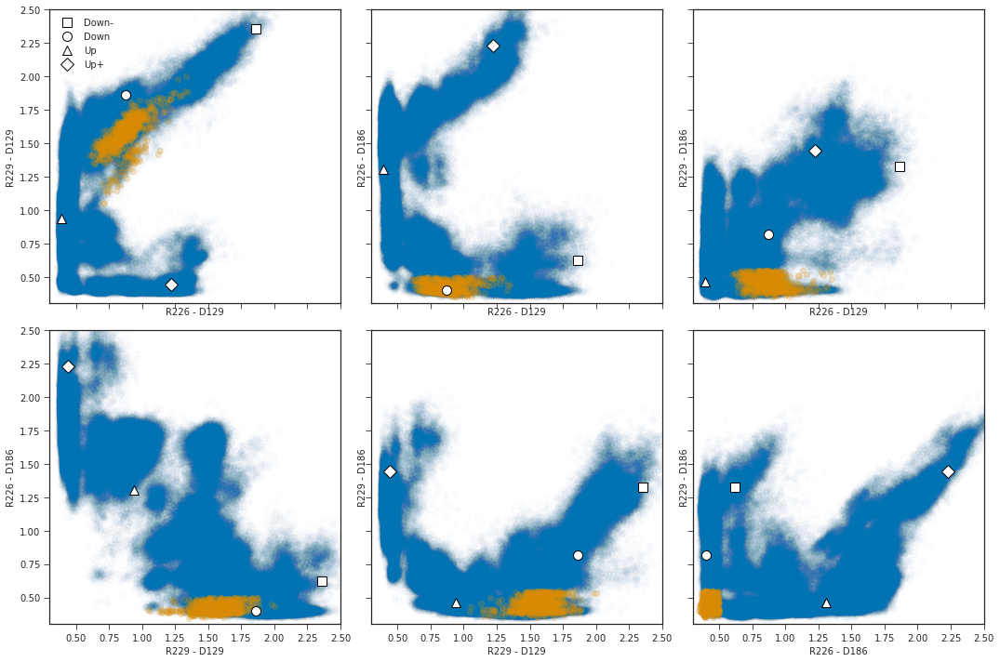

In [36]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [37]:
# salt bridges that would be good for down- to down transition (just shifted up by one arginine)
# R223-D129, R226-D129, R223-D186, R226-D186
sb_ids_dd = [36, 42, 41, 47]

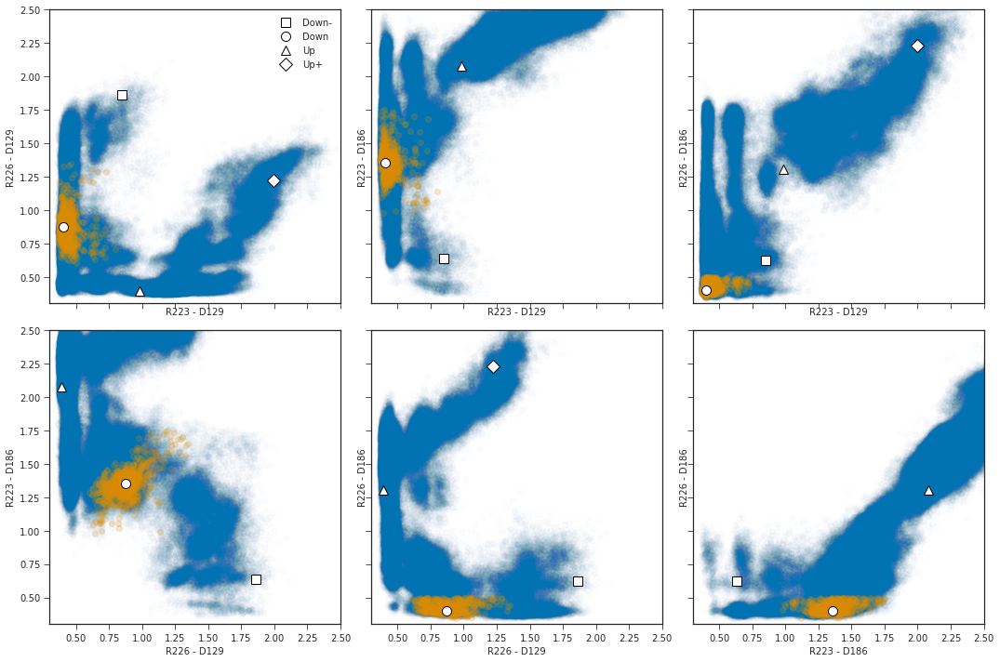

In [38]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_dd, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 36:43:6])  # indexes 36 and 42
util.plot_models(axes[0][1], feat2_centroids[:, 36:42:5])  # 36 and 41
util.plot_models(axes[0][2], feat2_centroids[:, 36:48:11])  # 36 and 47
util.plot_models(axes[1][0], feat2_centroids[:, 42:40:-1])  # indexes 42 and 41
util.plot_models(axes[1][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[1][2], feat2_centroids[:, 41:48:6])  # 41 and 47
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [31]:
# load centroids in CV space
cv_centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")

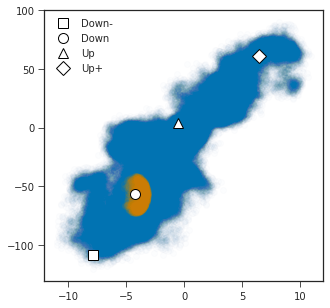

In [35]:
f = plt.figure(figsize=(5, 5))
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(down_cvs[::5, 0], down_cvs[::5, 1], alpha=0.05)
util.plot_models(ax, cv_centroids)
ax.legend(["Down-", "Down", "Up", "Up+"])

## remove cutoff for R3 

In [13]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
sb1 = data_arr[:, 47]  # R2-D186
sb3 = data_arr[:, 42]  # R2-D129

# ellipse centered at (-4.174, -50.8) with radii 1.1 nm and 16 deg (2 sigma in each direction) for down state
# take points where TIC 1 < 1.2 and R2 < 0.5 (lower salt bridges)
dist_ax_down = (dist + 4.240) / 1.1
rot_ax_down = (rot + 56.95) / 16
down_ids = (
    ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1)
    & (sb1 < 0.5)
    & (sb3 > 0.6)
    & (tic1 < 1.2)
).nonzero()[0]

In [14]:
down_cvs = cv_arr[down_ids]
down_sbs = data_arr[down_ids]

In [15]:
print(len(down_cvs))

53163


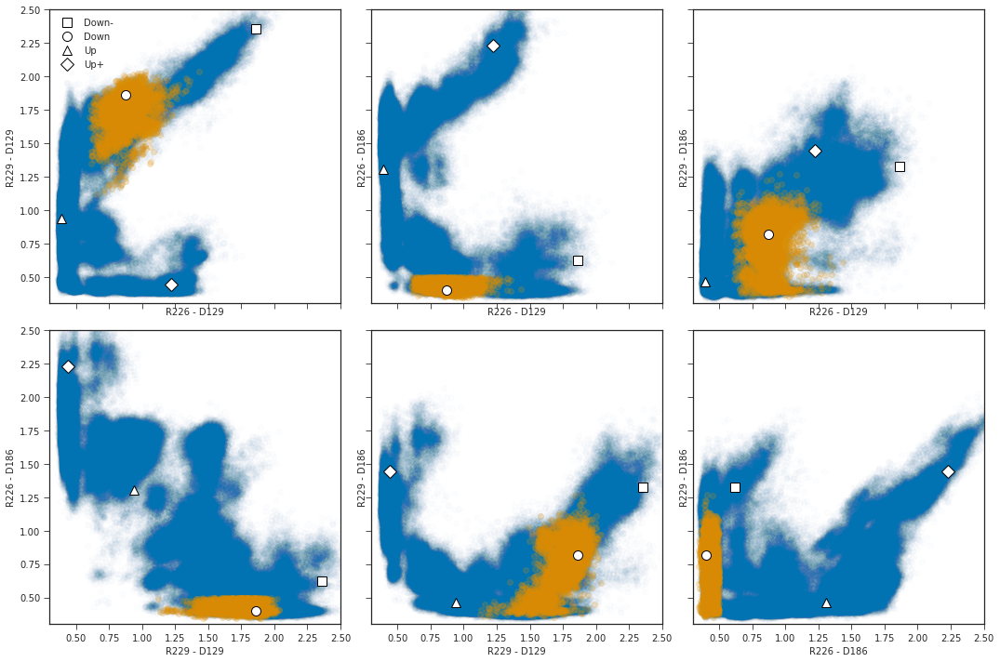

In [45]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

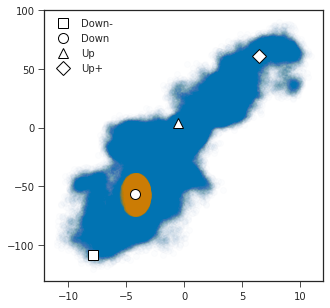

In [46]:
f = plt.figure(figsize=(5, 5))
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(down_cvs[::5, 0], down_cvs[::5, 1], alpha=0.05)
util.plot_models(ax, cv_centroids)
ax.legend(["Down-", "Down", "Up", "Up+"])

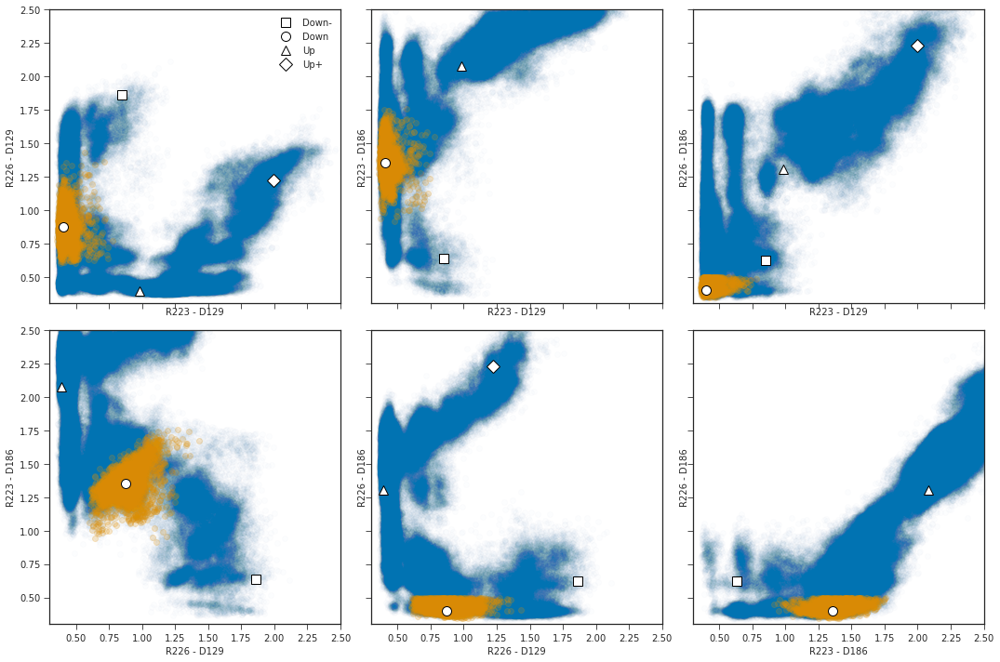

In [47]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_dd, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 36:43:6])  # indexes 36 and 42
util.plot_models(axes[0][1], feat2_centroids[:, 36:42:5])  # 36 and 41
util.plot_models(axes[0][2], feat2_centroids[:, 36:48:11])  # 36 and 47
util.plot_models(axes[1][0], feat2_centroids[:, 42:40:-1])  # indexes 42 and 41
util.plot_models(axes[1][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[1][2], feat2_centroids[:, 41:48:6])  # 41 and 47
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [53]:
down_livac = livac_arr[down_ids]

In [ ]:
cvs = 

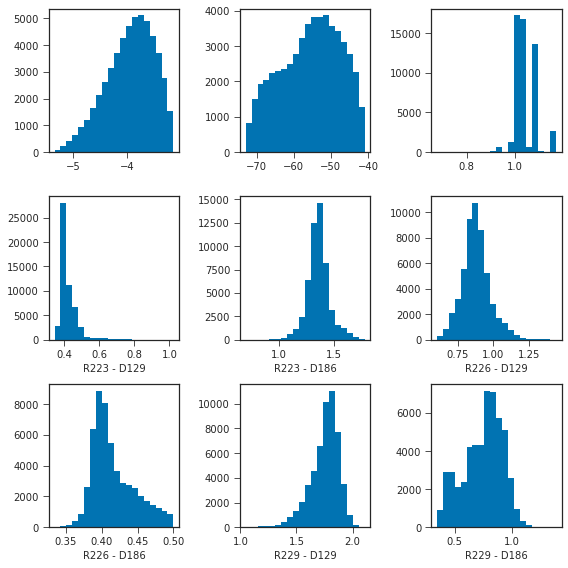

In [60]:
# histograms
f, axs = plt.subplots(3, 3, figsize=(8, 8))
axs[0][0].hist(down_cvs[:, 0], bins=20)
axs[0][1].hist(down_cvs[:, 1], bins=20)
axs[0][2].hist(down_livac[:, 1], bins=20)
for i, (idx, ax) in enumerate(zip((36, 41, 42, 47, 48, 53), axs.flat[3:])):
    ax.hist(down_sbs[:, idx], bins=20)
    ax.set_xlabel(f"{sb_labels[idx - 30]}")
f.tight_layout()

## smaller radius for rotation - see histograms above 

In [16]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
sb1 = data_arr[:, 47]  # R2-D186
sb3 = data_arr[:, 42]  # R2-D129

# ellipse centered at (-4.174, -50.8) with radii 1.1 nm and 8 deg (2 sigma in each direction) for down state
# take points where TIC 1 < 1.2 and R2 < 0.5 (lower salt bridges)
dist_ax_down = (dist + 4.240) / 1.1
rot_ax_down = (rot + 56.95) / 8
down_ids = (
    ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1)
    & (sb1 < 0.5)
    & (sb3 > 0.6)
    & (tic1 < 1.2)
).nonzero()[0]

In [17]:
down_cvs = cv_arr[down_ids]
down_sbs = data_arr[down_ids]

In [18]:
print(len(down_cvs))

26560


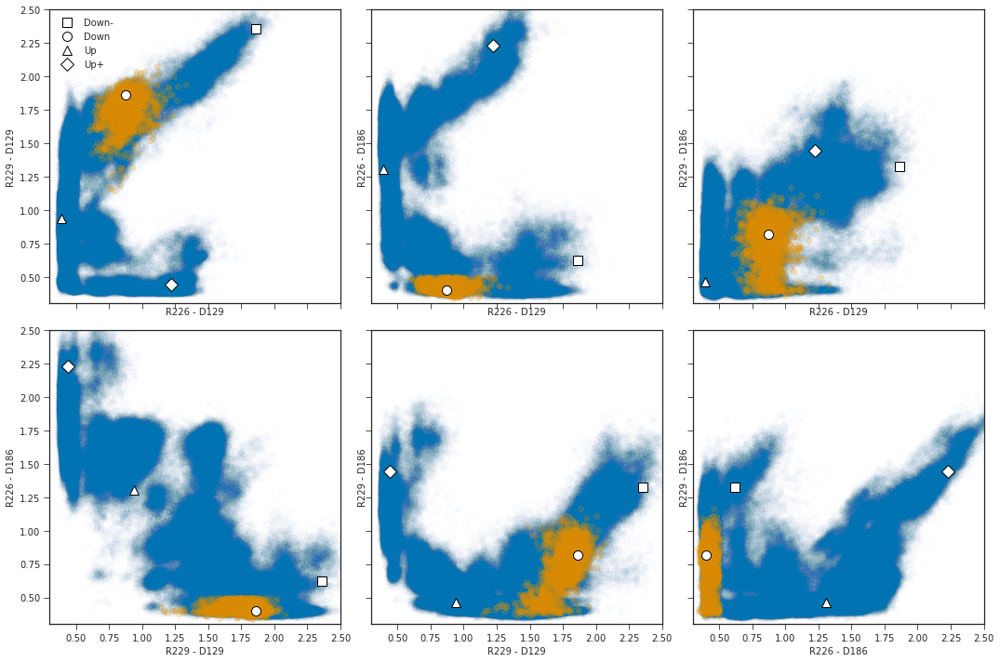

In [64]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

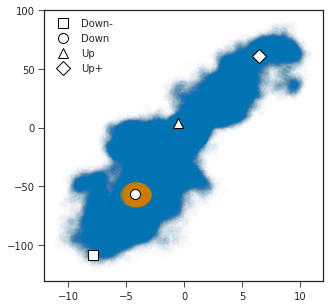

In [65]:
f = plt.figure(figsize=(5, 5))
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(down_cvs[::5, 0], down_cvs[::5, 1], alpha=0.05)
util.plot_models(ax, cv_centroids)
ax.legend(["Down-", "Down", "Up", "Up+"])

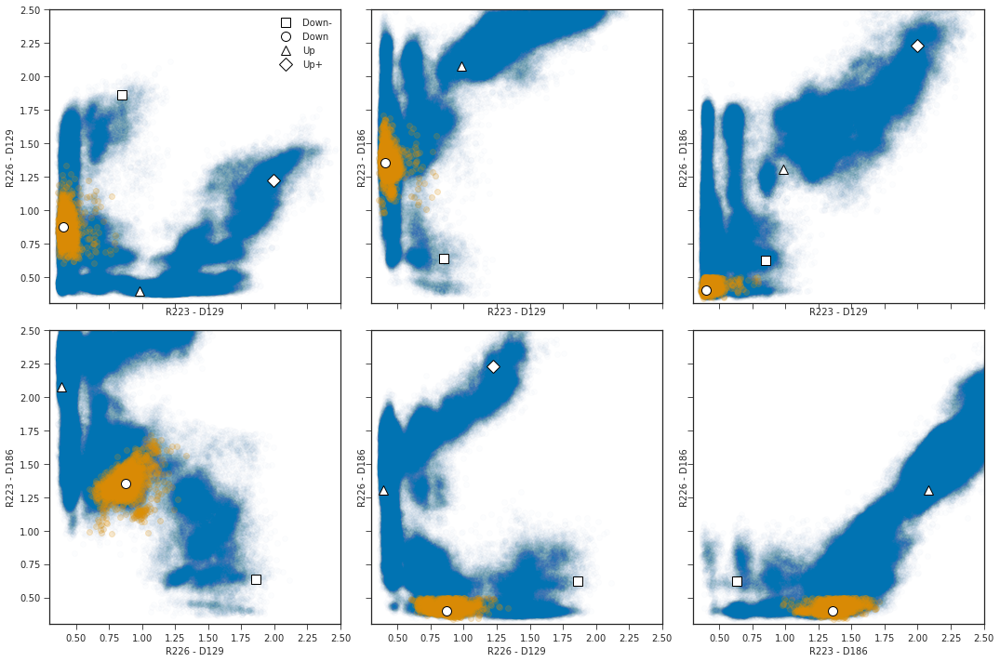

In [66]:
down_sbs = sb_data_arr[down_ids]

f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_dd, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(down_sbs[::10, sb1], down_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 36:43:6])  # indexes 36 and 42
util.plot_models(axes[0][1], feat2_centroids[:, 36:42:5])  # 36 and 41
util.plot_models(axes[0][2], feat2_centroids[:, 36:48:11])  # 36 and 47
util.plot_models(axes[1][0], feat2_centroids[:, 42:40:-1])  # indexes 42 and 41
util.plot_models(axes[1][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[1][2], feat2_centroids[:, 41:48:6])  # 41 and 47
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

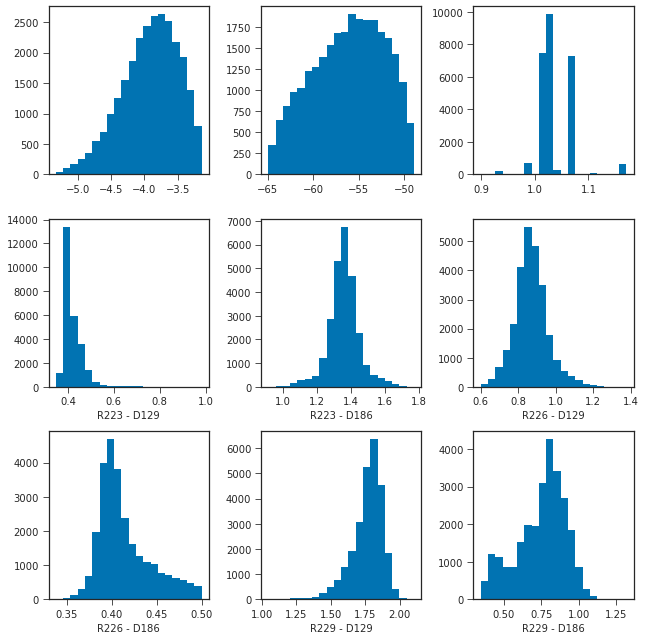

In [14]:
# histograms
down_livac = livac_arr[down_ids]

f, axs = plt.subplots(3, 3, figsize=(9, 9))
axs[0][0].hist(down_cvs[:, 0], bins=20)
axs[0][1].hist(down_cvs[:, 1], bins=20)
axs[0][2].hist(down_livac[:, 1], bins=20)
for i, (idx, ax) in enumerate(zip((36, 41, 42, 47, 48, 53), axs.flat[3:])):
    ax.hist(down_sbs[:, idx], bins=20)
    ax.set_xlabel(f"{sb_labels[idx - 30]}")
f.tight_layout()

In [19]:
# what states have low vlues of R229-D129 distance in down?
ids = np.argsort(down_sbs[:, 48])
print(down_ids[ids[:20]])

[1101430 1101467 1101426 1101424 1101433 1101421 1101748 1101435 1101425
 1101684 1101428 1101423 1101427 1101420 1101502 1101459 1101431 1101429
 1101438 1101696]


In [20]:
import importlib

importlib.reload(util)

<module 'util' from '../../python/util.py'>

In [21]:
# what states have low vlues of R229-D129 distance in down?
ids = np.argsort((down_sbs[:, 48] - 1.25) ** 2)
for i in down_ids[ids[:20]]:
    print(util.anton_frame(i), data_arr[i, 48])

(110, 1506) 1.2505267
(110, 1698) 1.2487895
(110, 1534) 1.2479596
(110, 1448) 1.2524174
(110, 1490) 1.2538445
(110, 1583) 1.2544577
(110, 1462) 1.2444477
(110, 1455) 1.2556967
(110, 1444) 1.2441287
(110, 1545) 1.2567143
(110, 1621) 1.2411164
(110, 1640) 1.2592971
(110, 1524) 1.2406117
(110, 1589) 1.240568
(110, 1662) 1.2600754
(110, 1588) 1.239727
(110, 1418) 1.2388654
(110, 1454) 1.2613621
(110, 1446) 1.2615463
(110, 1456) 1.2383348


In [24]:
ids = np.argsort((down_sbs[:, 48]) ** 2)
for i in down_ids[ids[:20]]:
    print(util.anton_frame(i), data_arr[i, 48])

(110, 1430) 1.0467045
(110, 1467) 1.0565581
(110, 1426) 1.063294
(110, 1424) 1.0796787
(110, 1433) 1.0931835
(110, 1421) 1.1078024
(110, 1748) 1.1080077
(110, 1435) 1.1163087
(110, 1425) 1.1219827
(110, 1684) 1.1257416
(110, 1428) 1.129767
(110, 1423) 1.1316007
(110, 1427) 1.1462535
(110, 1420) 1.1466217
(110, 1502) 1.1502018
(110, 1459) 1.156045
(110, 1431) 1.1561371
(110, 1429) 1.1571176
(110, 1438) 1.1627184
(110, 1696) 1.166656


In [23]:
# what states have low vlues of R229-D129 distance in down?
ids = np.argsort((down_sbs[:, 48] - 1.25) ** 2)
for i in down_ids[ids[:200]]:
    if util.anton_frame(i)[0] != 110:
        print(util.anton_frame(i), data_arr[i, 48])

(6, 346) 1.298361
(11, 3200) 1.3133293
(179, 21847) 1.3208317
(6, 1769) 1.3213865
(53, 5679) 1.3254713
(6, 1775) 1.3273814
(179, 21969) 1.3357893
(113, 1237) 1.3364588
(6, 1725) 1.3370348
(53, 9690) 1.3403019
(8, 4388) 1.3428978
(6, 848) 1.3478999
(6, 1726) 1.3485833
(53, 9718) 1.3522995
(53, 9698) 1.3561096
(4, 2659) 1.3625213
(9, 405) 1.3632116
(4, 2392) 1.364482
(6, 521) 1.3655139
(59, 372) 1.3669112
(6, 1777) 1.3684992
(11, 3199) 1.3693389
(179, 22018) 1.3700899
(9, 279) 1.372057
(6, 1779) 1.3721316
(6, 1544) 1.3721447
(4, 2644) 1.3730562
(53, 3027) 1.3748404
(53, 5680) 1.3769627
(179, 22004) 1.3775684
(6, 852) 1.3798587
(59, 246) 1.3809092
(6, 1752) 1.380986
(59, 374) 1.381299
(179, 21992) 1.3839657
(179, 22001) 1.3847932
(179, 22015) 1.3863536
(9, 484) 1.386552
(9, 295) 1.3866585
(53, 9748) 1.3867077
(53, 5127) 1.3871052
(13, 5091) 1.3874557
(53, 2862) 1.3885796
(9, 437) 1.3889946
(179, 21990) 1.3898377
(6, 1762) 1.3906028
(179, 22027) 1.3908436
(9, 404) 1.3920019
(59, 386) 1.392

In [25]:
# what states have low vlues of R229-D129 distance in down?
ids = np.argsort((down_sbs[:, 48]) ** 2)
for i in down_ids[ids[:200]]:
    if util.anton_frame(i)[0] != 110:
        print(util.anton_frame(i), data_arr[i, 48])

(6, 346) 1.298361
(11, 3200) 1.3133293
(179, 21847) 1.3208317
(6, 1769) 1.3213865
(53, 5679) 1.3254713
(6, 1775) 1.3273814
(179, 21969) 1.3357893
(113, 1237) 1.3364588
(6, 1725) 1.3370348
(53, 9690) 1.3403019
(8, 4388) 1.3428978
(6, 848) 1.3478999
(6, 1726) 1.3485833
(53, 9718) 1.3522995
(53, 9698) 1.3561096
(4, 2659) 1.3625213
(9, 405) 1.3632116
(4, 2392) 1.364482
(6, 521) 1.3655139
(59, 372) 1.3669112
(6, 1777) 1.3684992
(11, 3199) 1.3693389
(179, 22018) 1.3700899
(9, 279) 1.372057
(6, 1779) 1.3721316
(6, 1544) 1.3721447
(4, 2644) 1.3730562
(53, 3027) 1.3748404
(53, 5680) 1.3769627
(179, 22004) 1.3775684
(6, 852) 1.3798587
(59, 246) 1.3809092
(6, 1752) 1.380986
(59, 374) 1.381299
(179, 21992) 1.3839657
(179, 22001) 1.3847932
(179, 22015) 1.3863536
(9, 484) 1.386552
(9, 295) 1.3866585
(53, 9748) 1.3867077
(53, 5127) 1.3871052
(13, 5091) 1.3874557
(53, 2862) 1.3885796
(9, 437) 1.3889946
(179, 21990) 1.3898377
(6, 1762) 1.3906028
(179, 22027) 1.3908436
(9, 404) 1.3920019
(59, 386) 1.392

All of these seem normal, R226 is still below hydrophobic plug - even with extreme values in trajectory 110, the main difference appears to be that R229 is sort of further "centered" between S1 and S3

In [29]:
# for down to up transition, care mostly about R226 position:
# what are lower values of R226-D129 distance?
ids = np.argsort(down_sbs[:, 42])
for i in down_ids[ids[:20]]:
    print(util.anton_frame(i), data_arr[i, 42], cv_arr[i])

(13, 2897) 0.6000892 [ -3.2   -58.862]
(13, 3295) 0.60141253 [ -3.625 -56.841]
(110, 3962) 0.6021346 [ -5.184 -54.356]
(13, 3327) 0.60249573 [ -3.612 -57.64 ]
(58, 3772) 0.60268235 [ -4.477 -49.565]
(53, 5129) 0.60278106 [ -3.605 -55.116]
(6, 1725) 0.6029221 [ -4.136 -62.189]
(100, 9688) 0.60331774 [ -3.818 -51.911]
(58, 3745) 0.6051826 [ -4.88  -50.673]
(13, 3314) 0.6053181 [ -3.502 -55.169]
(110, 3571) 0.6053792 [ -4.117 -56.782]
(58, 3723) 0.6055981 [ -4.435 -52.344]
(58, 3771) 0.6058961 [ -4.665 -51.99 ]
(110, 4569) 0.6061831 [ -4.032 -50.135]
(58, 3515) 0.6064603 [ -4.266 -59.302]
(13, 3344) 0.6080617 [ -3.824 -62.571]
(13, 3485) 0.6103409 [ -3.45  -52.967]
(105, 995) 0.61178595 [ -4.552 -52.548]
(58, 3531) 0.61243784 [ -4.337 -56.899]
(58, 3518) 0.61268026 [ -4.531 -59.239]


In [26]:
# what are states with R229-D129 ~ 1.5 and R229-D186 ~ 0.5
ids = np.argsort((down_sbs[:, 48] - 1.5) ** 2 + (down_sbs[:, 53] - 0.5) ** 2)
for i in down_ids[ids[:20]]:
    print(util.anton_frame(i), data_arr[i, 48], data_arr[i, 53])

(8, 4081) 1.4981669 0.4975229
(4, 1937) 1.5025967 0.502989
(8, 4141) 1.4958323 0.49809045
(8, 5858) 1.5020924 0.5049198
(0, 3539) 1.5022475 0.49468064
(100, 9512) 1.5062876 0.5019662
(4, 2656) 1.4961758 0.49456042
(53, 9699) 1.503764 0.49427736
(8, 272) 1.505106 0.506164
(6, 1733) 1.4950987 0.49283165
(8, 4017) 1.5050876 0.49223673
(8, 4459) 1.4903953 0.4988126
(53, 9651) 1.5066394 0.50719035
(8, 3055) 1.4947627 0.5083394
(8, 1751) 1.5081083 0.50633293
(8, 3996) 1.5014441 0.5102989
(8, 4016) 1.4898866 0.50380653
(8, 5581) 1.5104252 0.49438965
(8, 2385) 1.5078398 0.50971955
(6, 1556) 1.4917845 0.48998576


**All very normal apparently**

In [15]:
down_ids[:10]

array([ 62,  63, 392, 433, 435, 444, 455, 457, 458, 468])

In [26]:
sb_labels[18]

'R229 - D129'

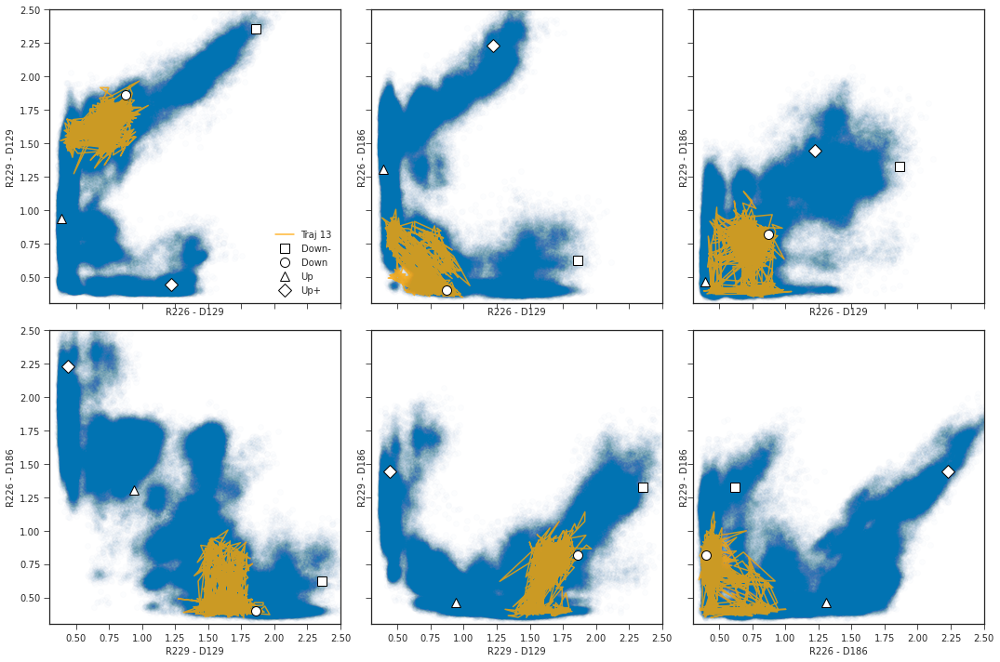

In [37]:
# what about trajectory 13
traj = 13
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(data_arr[::10, sb1], data_arr[::10, sb2], alpha=0.01)
    ax.plot(data_trajs[traj][::10, sb1], data_trajs[13][::10, sb2], "orange", alpha=0.8)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Traj 13", "Down-", "Down", "Up", "Up+"])
f.tight_layout()

### ignore committors, wrong one 

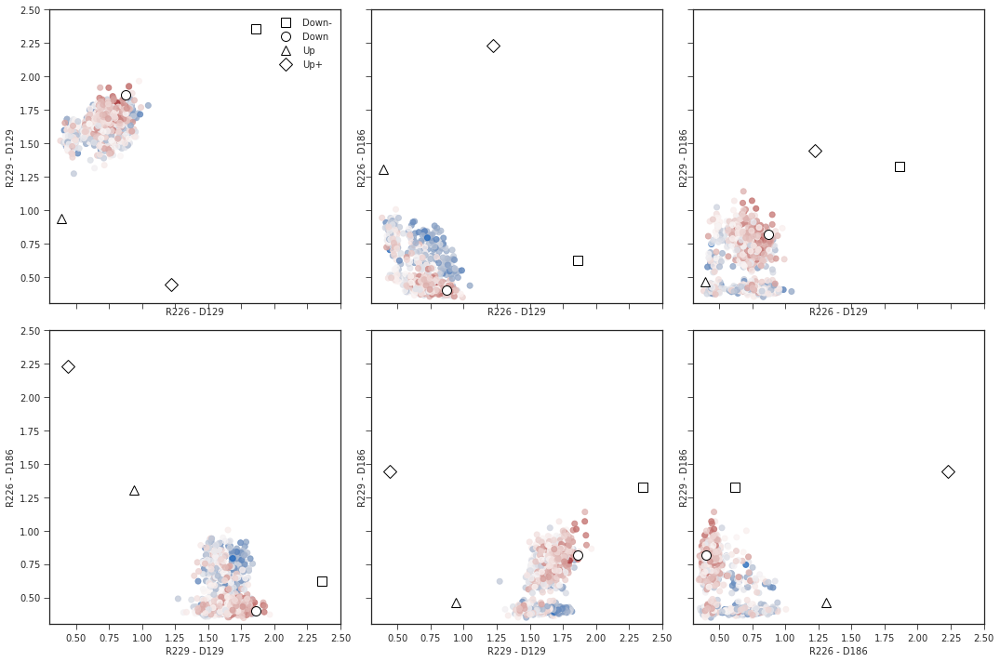

In [43]:
# plot committor for trajectory 13
q_all = np.load("../../data/", allow_pickle=True)
# 20 ns committor
q = q_all[7][13].clip(min=0, max=1)

# what about trajectory 13
traj = 13
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    #     ax.scatter(data_arr[::10, sb1], data_arr[::10, sb2], 'k', alpha=0.01)
    ax.scatter(
        data_trajs[traj][::10, sb1],
        data_trajs[13][::10, sb2],
        c=q[::10],
        cmap="vlag",
        alpha=0.8,
    )
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [44]:
committor = np.concatenate(q_all[7]).clip(min=0, max=1)

In [53]:
# for down to up transition, care mostly about R226 position:
# what are lower values of R226-D129 distance?
ids = np.argsort(down_sbs[:, 42])
for i in down_ids[ids[:20]]:
    print(
        util.anton_frame(i), data_arr[i, 42], data_arr[i, 46], cv_arr[i], committor[i]
    )

(13, 2897) 0.6000892 1.0007732 [ -3.2   -58.862] 0.14236459138446417
(13, 3295) 0.60141253 1.0015564 [ -3.625 -56.841] 0.12179966515443102
(110, 3962) 0.6021346 1.193497 [ -5.184 -54.356] 0.10610651337299346
(13, 3327) 0.60249573 1.0717402 [ -3.612 -57.64 ] 0.1509529518338471
(58, 3772) 0.60268235 1.1023253 [ -4.477 -49.565] 0.12637411569317072
(53, 5129) 0.60278106 1.0851057 [ -3.605 -55.116] 0.12514865447113474
(6, 1725) 0.6029221 0.9119052 [ -4.136 -62.189] 0.09630737181670787
(100, 9688) 0.60331774 1.1023248 [ -3.818 -51.911] 0.1606475246618978
(58, 3745) 0.6051826 1.0523208 [ -4.88  -50.673] 0.1352567501835186
(13, 3314) 0.6053181 1.0934834 [ -3.502 -55.169] 0.133609344630341
(110, 3571) 0.6053792 1.2023511 [ -4.117 -56.782] 0.08759308574559493
(58, 3723) 0.6055981 1.1699492 [ -4.435 -52.344] 0.12814738861272407
(58, 3771) 0.6058961 1.1256859 [ -4.665 -51.99 ] 0.12372768086050134
(110, 4569) 0.6061831 1.2050616 [ -4.032 -50.135] 0.1561999531459388
(58, 3515) 0.6064603 1.1609492 [ 

In [48]:
sb_labels[16]

'R226 - E183'

(array([8.000e+00, 1.500e+01, 6.700e+01, 2.720e+02, 7.990e+02, 1.688e+03,
        2.997e+03, 4.442e+03, 5.236e+03, 4.105e+03, 2.693e+03, 1.605e+03,
        1.072e+03, 7.360e+02, 4.930e+02, 2.270e+02, 8.100e+01, 1.800e+01,
        5.000e+00, 1.000e+00]),
 array([0.6642921 , 0.69919115, 0.73409027, 0.7689893 , 0.8038884 ,
        0.83878744, 0.87368655, 0.9085856 , 0.94348466, 0.9783838 ,
        1.0132828 , 1.0481819 , 1.083081  , 1.11798   , 1.1528791 ,
        1.1877782 , 1.2226772 , 1.2575763 , 1.2924755 , 1.3273745 ,
        1.3622736 ], dtype=float32),
 <BarContainer object of 20 artists>)

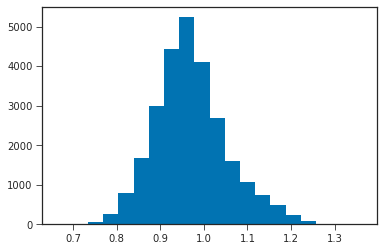

In [49]:
plt.hist(down_sbs[:, 46], bins=20)

In [52]:
# highest R226-E183 distance
# for down to up transition, care mostly about R226 position:
# what are lower values of R226-D129 distance?
ids = np.argsort(down_sbs[:, 46])
for i in down_ids[ids[-20:]]:
    print(util.anton_frame(i), data_arr[i, 46], cv_arr[i], committor[i])

(166, 9056) 1.2668128 [ -3.23  -57.386] 0.14669358040416425
(58, 3716) 1.2670194 [ -4.32  -51.172] 0.13119087235935295
(174, 6409) 1.267229 [ -3.296 -60.466] 0.16960796833279468
(166, 2492) 1.2680986 [ -4.466 -62.459] 0.10042220450527006
(58, 5159) 1.26834 [ -3.593 -62.167] 0.15751890072321673
(58, 3528) 1.2685086 [ -4.615 -54.229] 0.13914208485703117
(100, 9500) 1.2698418 [ -3.599 -52.989] 0.14721029812583994
(59, 2825) 1.2700415 [ -3.237 -59.252] 0.16691911421114322
(8, 5615) 1.2745783 [ -3.336 -58.849] 0.08739596893223564
(65, 7111) 1.2775595 [ -4.437 -52.802] 0.10811343572354387
(58, 3401) 1.2793874 [ -3.448 -56.839] 0.14356889792658756
(179, 11264) 1.2861995 [ -4.599 -51.031] 0.1664351071327295
(58, 3522) 1.2868913 [ -4.032 -59.104] 0.129083734233246
(110, 1684) 1.2877446 [ -3.6   -51.359] 0.08649154458839944
(58, 2326) 1.2943747 [ -3.962 -62.235] 0.14782774242496588
(166, 8411) 1.2960733 [ -3.803 -62.801] 0.14086675388223463
(100, 9860) 1.2960833 [ -3.429 -53.434] 0.1340642290482

# Previous up state

In [36]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = sb_data_arr[:, 47]  # R2-D186
sb6 = sb_data_arr[:, 53]  # R3-D186
sb7 = sb_data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
# dist_ax_upp = ((dist - 4.535) / 0.632)
# rot_ax_upp = ((rot - 43.7) / 4.0)
# upplus_ids = (((dist_ax_upp**2 + rot_ax_upp**2) < 1)
#               & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]
up_cvs = cv_arr[up_ids]
up_sbs = sb_data_arr[up_ids]

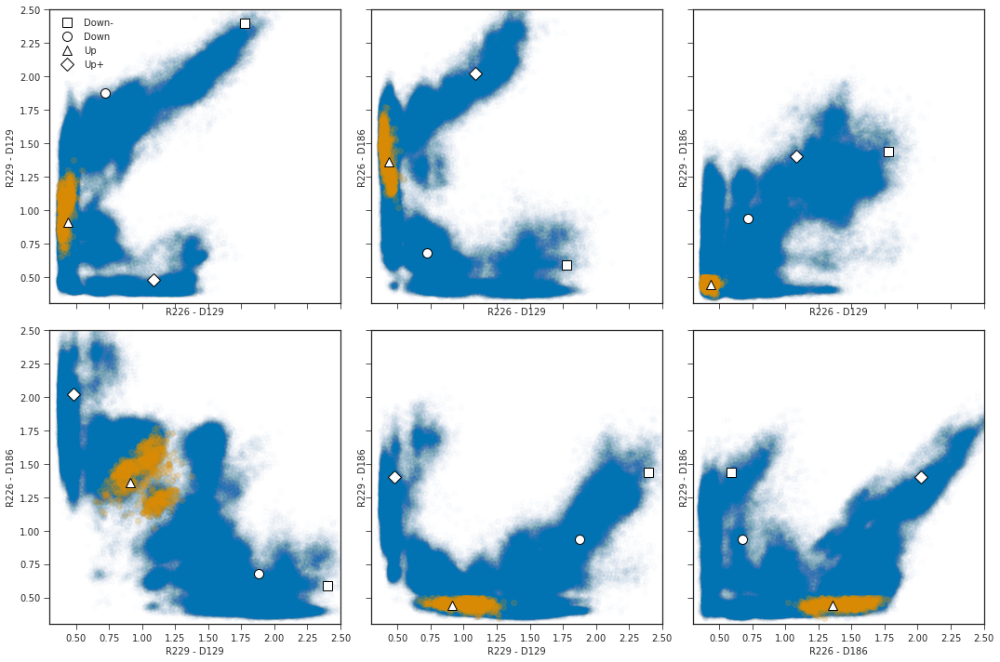

In [38]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[::10, sb1], up_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_models[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_models[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_models[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_models[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

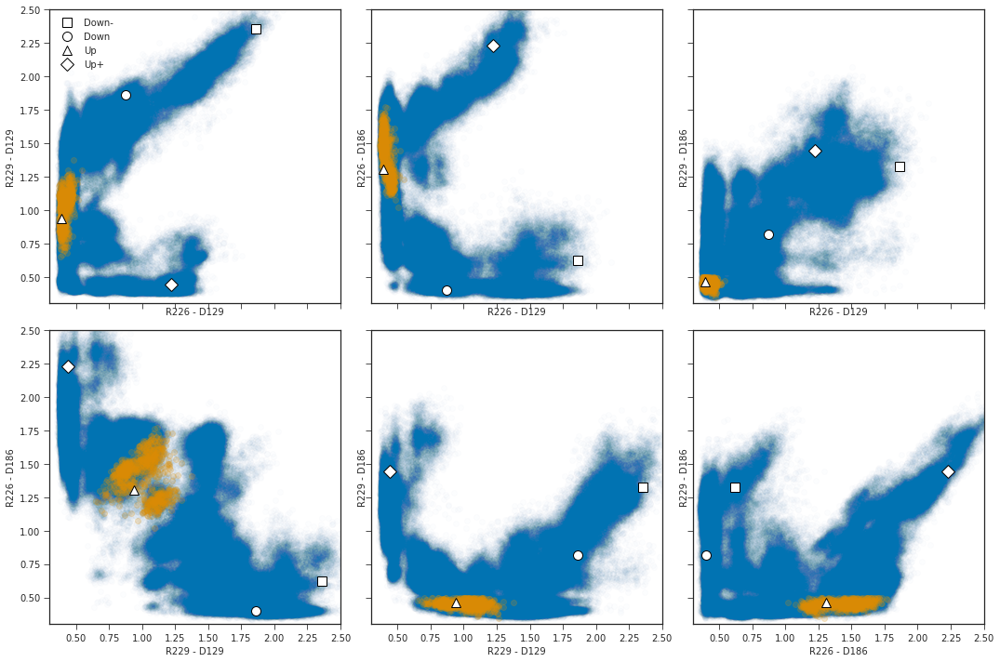

In [39]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[::10, sb1], up_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [40]:
sb_ids_uu = [48, 54, 53, 59]

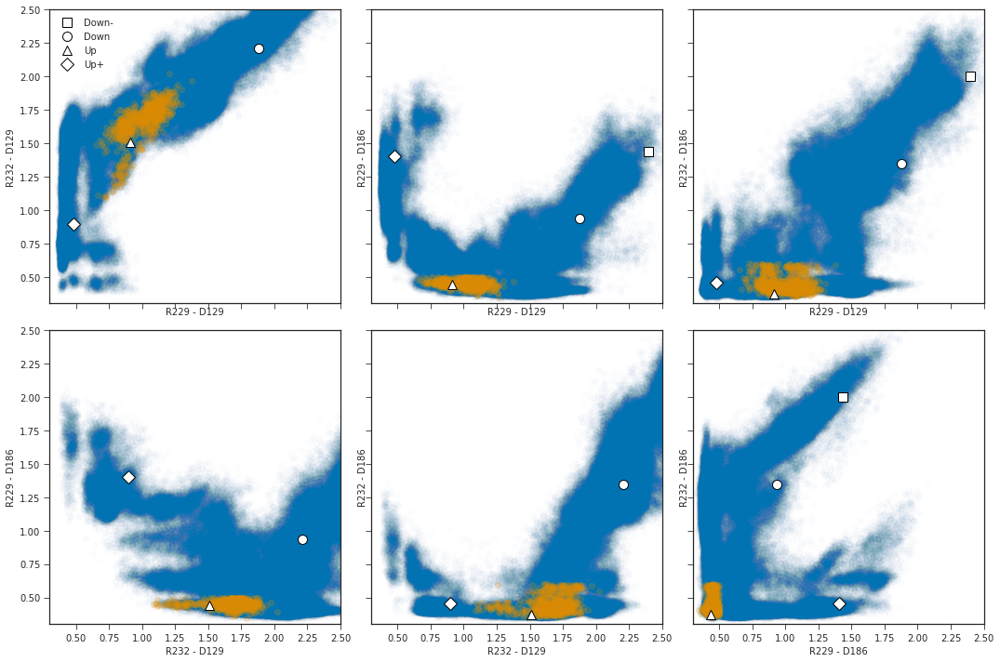

In [41]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[::10, sb1], up_sbs[::10, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

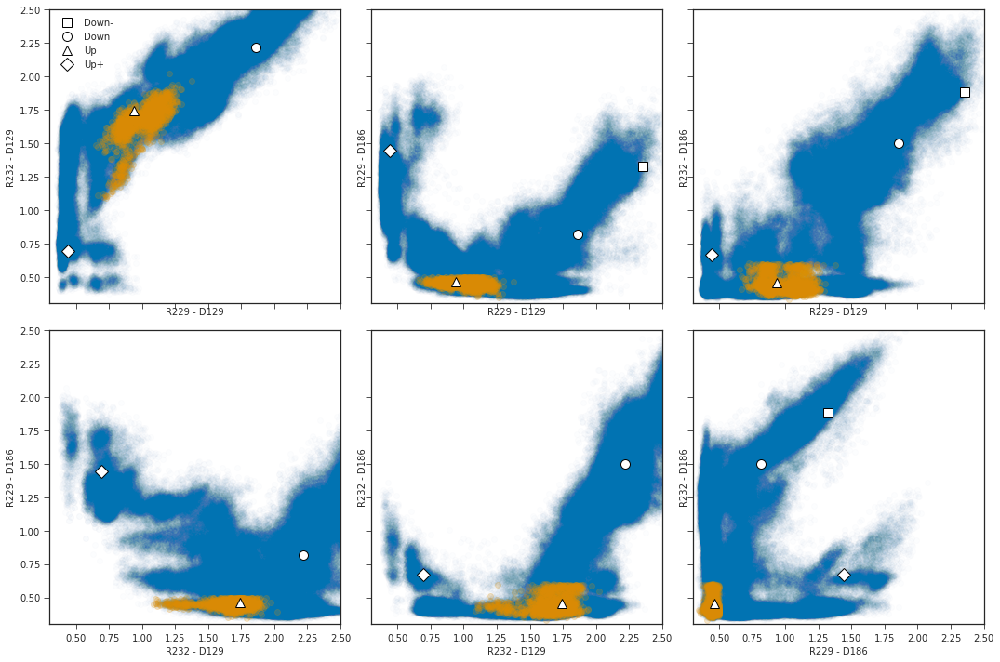

In [44]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[::5, sb1], up_sbs[::5, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_centroids[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_centroids[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_centroids[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_centroids[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [43]:
# load centroids in CV space
cv_centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")

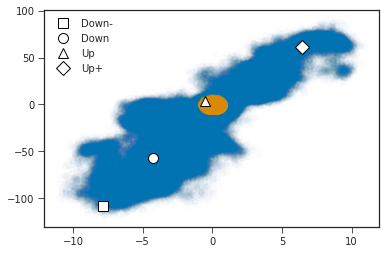

In [45]:
f = plt.figure()
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(up_cvs[::5, 0], up_cvs[::5, 1], alpha=0.2)
util.plot_models(ax, cv_centroids)
ax.legend(["Down-", "Down", "Up", "Up+"])

## change state definition to center around centroids

In [46]:
cv_centroids[2]

array([-0.506,  3.94 ])

In [29]:
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = data_arr[:, 47]  # R2-D186
sb6 = data_arr[:, 53]  # R3-D186
sb7 = data_arr[:, 59]  # R4-D186

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    ((((dist + 0.506) / 0.84) ** 2 + ((rot - 3.94) / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]
up_cvs = cv_arr[up_ids]
up_sbs = data_arr[up_ids]

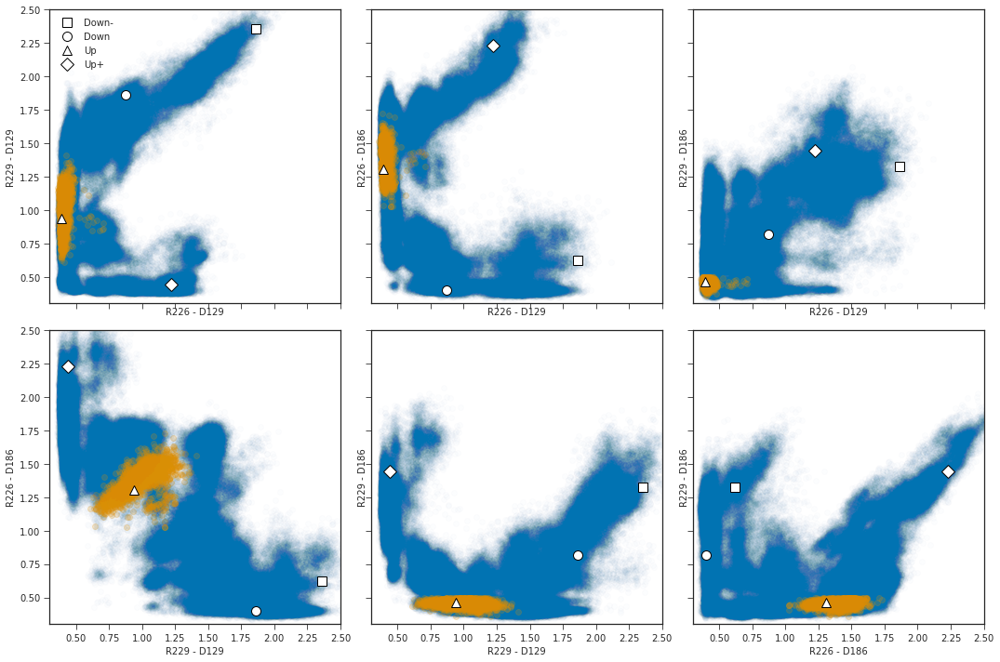

In [51]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[:, sb1], up_sbs[:, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

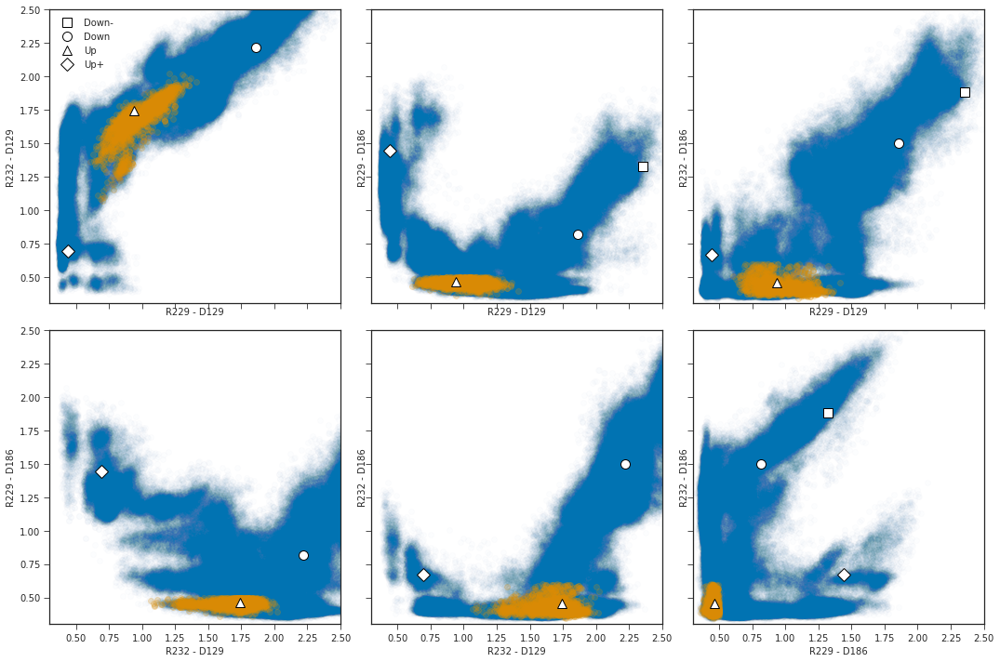

In [52]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(sb_data_arr[::10, sb1], sb_data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[:, sb1], up_sbs[:, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_centroids[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_centroids[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_centroids[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_centroids[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

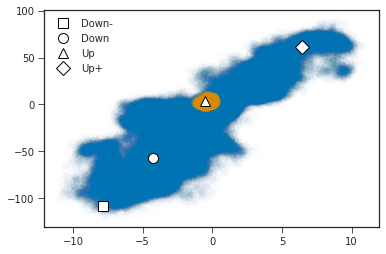

In [50]:
f = plt.figure()
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(up_cvs[::5, 0], up_cvs[::5, 1], alpha=0.2)
util.plot_models(ax, cv_centroids)
ax.legend(["Down-", "Down", "Up", "Up+"])

In [53]:
len(up_cvs)

2273

## without R4 cutoff 

In [54]:
sb_labels[18]

'R229 - D129'

In [87]:
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = data_arr[:, 53]  # R229-D186
sb6 = data_arr[:, 42]  # R226-D129
sb7 = data_arr[:, 48]  # R229-D129
sb8 = data_arr[:, 59]  # R4-D186

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    ((((dist + 0.506) / 0.84) ** 2 + ((rot - 3.94) / 7.6) ** 2) < 1)
    & (sb7 < 1.1)
    & (sb6 < 0.5)
    & (sb5 < 0.75)
    & (sb8 < 0.6)
    & (tic2 > -1)
).nonzero()[0]
up_cvs = cv_arr[up_ids]
up_sbs = data_arr[up_ids]

In [88]:
len(up_cvs)

4614

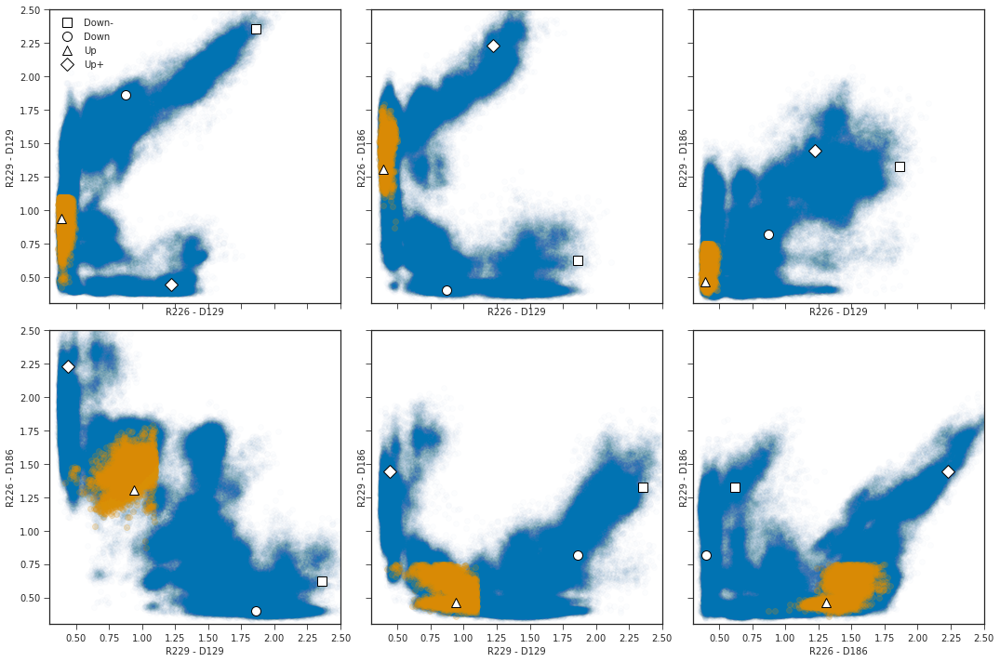

In [89]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    ax.scatter(data_arr[::10, sb1], data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[:, sb1], up_sbs[:, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_centroids[:, 42:49:6])  # indexes 42 and 48
util.plot_models(axes[0][1], feat2_centroids[:, 42:48:5])  # 42 and 47
util.plot_models(axes[0][2], feat2_centroids[:, 42:54:11])  # 42 and 53
util.plot_models(axes[1][0], feat2_centroids[:, 48:46:-1])  # indexes 48 and 47
util.plot_models(axes[1][1], feat2_centroids[:, 48:54:5])  # 48 and 53
util.plot_models(axes[1][2], feat2_centroids[:, 47:54:6])  # 47 and 53
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

In [90]:
# maximum R229-D129 distance
ids = np.argsort((up_sbs[:, 48]) ** 2)
for i in up_ids[ids[-20:]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 48]}, {data_arr[i, 42]}")

(29, 1952): 1.0979020595550537, 0.38317880034446716
(29, 1176): 1.09792160987854, 0.4022599160671234
(89, 527): 1.0979562997817993, 0.4056106507778168
(122, 852): 1.0980979204177856, 0.4466957151889801
(29, 1616): 1.0982303619384766, 0.38293081521987915
(243, 2712): 1.098279595375061, 0.422945499420166
(194, 2117): 1.0983155965805054, 0.4370514452457428
(29, 1212): 1.0983737707138062, 0.3833131194114685
(28, 514): 1.0983847379684448, 0.4206137955188751
(183, 1331): 1.0984225273132324, 0.42442551255226135
(74, 1331): 1.0984225273132324, 0.42442551255226135
(29, 1084): 1.0984398126602173, 0.3917779326438904
(291, 173): 1.098646879196167, 0.3899153470993042
(291, 179): 1.0986778736114502, 0.38812756538391113
(72, 564): 1.0987602472305298, 0.4218541979789734
(29, 1202): 1.0989904403686523, 0.40095633268356323
(75, 8286): 1.0990855693817139, 0.42710188031196594
(29, 2152): 1.0991888046264648, 0.3783451020717621
(28, 614): 1.099562644958496, 0.3982574939727783
(77, 286): 1.0997354984283447, 

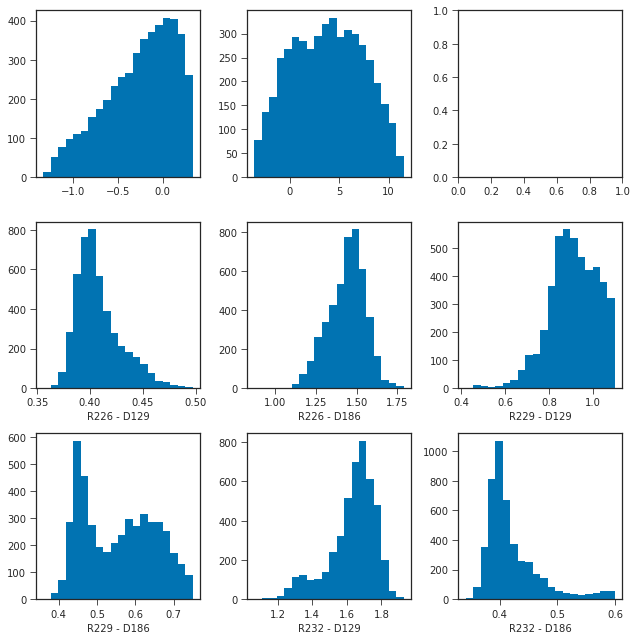

In [91]:
# histograms of CVs
f, axs = plt.subplots(3, 3, figsize=(9, 9))
axs[0][0].hist(up_cvs[:, 0], bins=20)
axs[0][1].hist(up_cvs[:, 1], bins=20)
# axs[0][2].hist(down_livac[:, 1], bins=20)
for i, (idx, ax) in enumerate(zip((42, 47, 48, 53, 54, 59), axs.flat[3:])):
    ax.hist(up_sbs[:, idx], bins=20)
    ax.set_xlabel(f"{sb_labels[idx - 30]}")
f.tight_layout()

In [92]:
# maximum R226-D129 distance
ids = np.argsort((up_sbs[:, 42]) ** 2)
for i in up_ids[ids[-20:]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 48]}, {data_arr[i, 42]}")

(121, 4041): 1.0289946794509888, 0.4800187349319458
(122, 698): 1.0720494985580444, 0.48005521297454834
(194, 752): 0.9137144088745117, 0.4821504056453705
(121, 4045): 1.024387240409851, 0.4823163151741028
(131, 185): 0.8603860139846802, 0.48257333040237427
(89, 739): 0.8802869319915771, 0.48310142755508423
(89, 754): 0.8890641927719116, 0.48400208353996277
(89, 789): 0.9607835412025452, 0.48408886790275574
(32, 805): 1.0506465435028076, 0.48409196734428406
(89, 769): 0.9789530634880066, 0.4841260612010956
(194, 1790): 0.784031331539154, 0.4842871427536011
(24, 6687): 1.0052846670150757, 0.4844595193862915
(89, 697): 0.897602379322052, 0.4848463833332062
(27, 405): 0.8653750419616699, 0.48638051748275757
(234, 268): 0.7954232096672058, 0.48677510023117065
(241, 4083): 0.9451248645782471, 0.4895170331001282
(89, 775): 0.9081811904907227, 0.4908004105091095
(89, 759): 0.8505063652992249, 0.49491211771965027
(89, 396): 0.9914081692695618, 0.49679479002952576
(194, 2044): 0.866539120674133

In [93]:
# maximum R229-D186 distance
ids = np.argsort((up_sbs[:, 53] - 0.9) ** 2)
for i in up_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 53]}, {data_arr[i, 48]}")

(123, 1296): 0.7498433589935303, 0.8968066573143005
(25, 58): 0.749598503112793, 0.6707526445388794
(24, 5510): 0.7495425939559937, 0.6941182017326355
(82, 7638): 0.7489244937896729, 0.4861049950122833
(194, 1838): 0.7484123706817627, 0.8379201292991638
(234, 10): 0.7483721971511841, 0.683967113494873
(89, 353): 0.7479372024536133, 0.8641446828842163
(24, 5499): 0.7479144334793091, 0.7012882232666016
(234, 1450): 0.747864305973053, 0.6285237073898315
(123, 1177): 0.7476155161857605, 0.8395869135856628
(24, 6398): 0.7476117014884949, 0.8521860837936401
(24, 5843): 0.7476001977920532, 0.893155038356781
(24, 6418): 0.7475332617759705, 0.8507062196731567
(234, 386): 0.7470830082893372, 0.8569306135177612
(74, 1291): 0.7470462322235107, 0.9056285619735718
(183, 1291): 0.7470462322235107, 0.9056285619735718
(27, 137): 0.7469624876976013, 0.7875207662582397
(194, 1820): 0.7467871308326721, 0.8064006567001343
(234, 1322): 0.7467276453971863, 0.8287950158119202
(24, 6332): 0.7466920614242554, 0

**Basically towards up+ state**

In [94]:
# middle R229-D186 distance
ids = np.argsort((up_sbs[:, 53] - 0.65) ** 2)
for i in up_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 53]}, {data_arr[i, 48]}")

(243, 2532): 0.6499854326248169, 1.0291516780853271
(234, 102): 0.6500307321548462, 1.0294387340545654
(90, 4074): 0.6500508189201355, 0.7046034932136536
(24, 6541): 0.6500815749168396, 0.9349551200866699
(183, 1076): 0.6498845815658569, 0.9150110483169556
(74, 1076): 0.6498845815658569, 0.9150110483169556
(28, 1573): 0.6501370668411255, 0.850013017654419
(29, 1705): 0.6502278447151184, 0.8265894055366516
(234, 1478): 0.6497077941894531, 0.9196667671203613
(24, 6702): 0.6497052311897278, 0.8814651966094971
(194, 1893): 0.6496937870979309, 0.9040963053703308
(24, 6002): 0.650343120098114, 0.8182726502418518
(24, 6668): 0.6496507525444031, 0.8393303155899048
(194, 1930): 0.6503545641899109, 0.881674587726593
(29, 1871): 0.6504284143447876, 0.8842505216598511
(234, 285): 0.6504383683204651, 0.9035325646400452
(28, 1524): 0.6495331525802612, 0.8528270125389099
(89, 803): 0.6494890451431274, 0.933634340763092
(72, 340): 0.6505590677261353, 0.7587871551513672
(72, 669): 0.6505613327026367, 0

In [95]:
# smallest R229-D186 distance
ids = np.argsort((up_sbs[:, 53]) ** 2)
for i in up_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 53]}, {data_arr[i, 48]}")

(90, 3799): 0.35954415798187256, 0.9398606419563293
(90, 4936): 0.38012364506721497, 0.9893200993537903
(28, 514): 0.3820694386959076, 1.0983847379684448
(32, 661): 0.38328057527542114, 1.0586506128311157
(28, 496): 0.3836143910884857, 1.082095742225647
(24, 5928): 0.38414323329925537, 1.0279499292373657
(32, 663): 0.3852103054523468, 1.0429065227508545
(124, 553): 0.3856644630432129, 0.8828874230384827
(90, 4940): 0.3857991397380829, 0.852546215057373
(90, 4922): 0.3869186043739319, 1.012487530708313
(28, 437): 0.38853827118873596, 1.0255681276321411
(72, 443): 0.38992950320243835, 1.0476670265197754
(77, 55): 0.39107418060302734, 0.9816069006919861
(24, 5897): 0.3912045955657959, 1.0930603742599487
(90, 4945): 0.39158138632774353, 0.95272296667099
(24, 5898): 0.3919859528541565, 1.092543363571167
(25, 24): 0.39330142736434937, 0.974628210067749
(90, 3795): 0.39393147826194763, 0.8897870779037476
(24, 5859): 0.39439332485198975, 1.0837587118148804
(32, 695): 0.3954111635684967, 1.0584

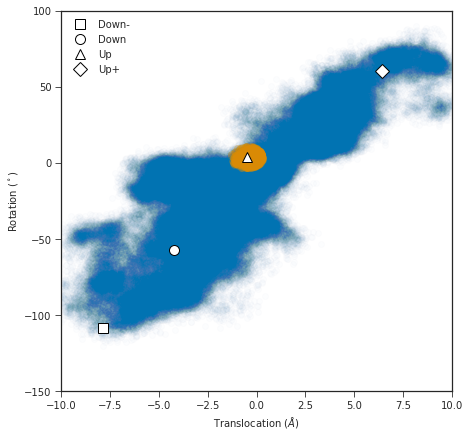

In [96]:
f = plt.figure(figsize=(7, 7))
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(up_cvs[::5, 0], up_cvs[::5, 1], alpha=0.2)
util.format_cvs(ax, centroids=True)
ax.legend(["Down-", "Down", "Up", "Up+"])

### for up to up+ transition

In [36]:
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb1 = data_arr[:, 42]  # R226-D129
sb2 = data_arr[:, 48]  # R229-D129
sb3 = data_arr[:, 53]  # R229-D186
sb4 = data_arr[:, 59]  # R4-D186

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    ((((dist + 0.506) / 0.84) ** 2 + ((rot - 3.94) / 7.6) ** 2) < 1)
    & (sb1 < 0.5)
    & (sb2 > 0.6)
    & (sb3 < 0.55)
    & (tic2 > -1)
).nonzero()[0]
up_cvs = cv_arr[up_ids]
up_sbs = data_arr[up_ids]

In [37]:
len(up_cvs)

3396

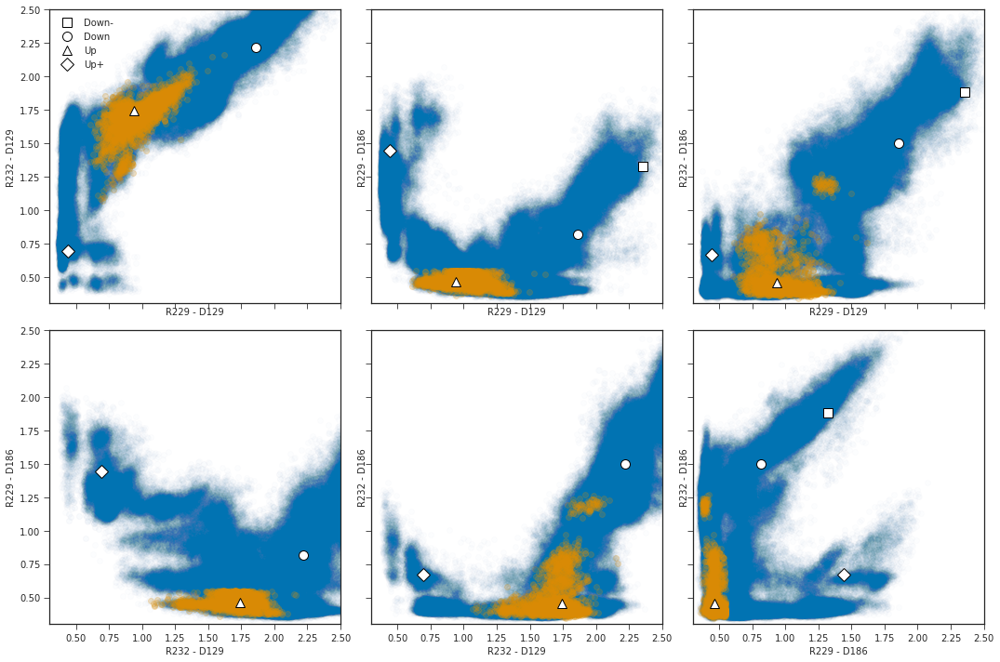

In [38]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(data_arr[::10, sb1], data_arr[::10, sb2], alpha=0.01)
    ax.scatter(up_sbs[:, sb1], up_sbs[:, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

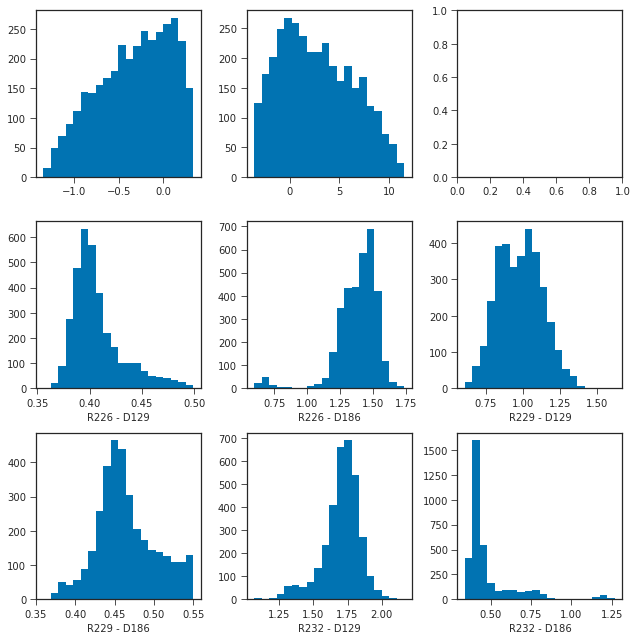

In [39]:
# histograms of CVs
f, axs = plt.subplots(3, 3, figsize=(9, 9))
axs[0][0].hist(up_cvs[:, 0], bins=20)
axs[0][1].hist(up_cvs[:, 1], bins=20)
# axs[0][2].hist(down_livac[:, 1], bins=20)
for i, (idx, ax) in enumerate(zip((42, 47, 48, 53, 54, 59), axs.flat[3:])):
    ax.hist(up_sbs[:, idx], bins=20)
    ax.set_xlabel(f"{sb_labels[idx - 30]}")
f.tight_layout()

In [40]:
# min R232-D129 distance
ids = np.argsort((up_sbs[:, 54]) ** 2)
for i in up_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 54]}")

(27, 563): 1.0667282342910767
(27, 511): 1.0856915712356567
(27, 514): 1.091892957687378
(131, 643): 1.0955647230148315
(27, 521): 1.110396385192871
(27, 510): 1.11268150806427
(27, 512): 1.1447079181671143
(27, 560): 1.1512024402618408
(27, 518): 1.167654037475586
(24, 6160): 1.1916295289993286
(27, 549): 1.1937751770019531
(131, 1095): 1.1999754905700684
(24, 6168): 1.2085884809494019
(24, 6216): 1.2214213609695435
(24, 6159): 1.2312380075454712
(24, 6144): 1.2336539030075073
(24, 6165): 1.236551284790039
(24, 6256): 1.2443524599075317
(24, 6264): 1.2475838661193848
(24, 6186): 1.2480748891830444


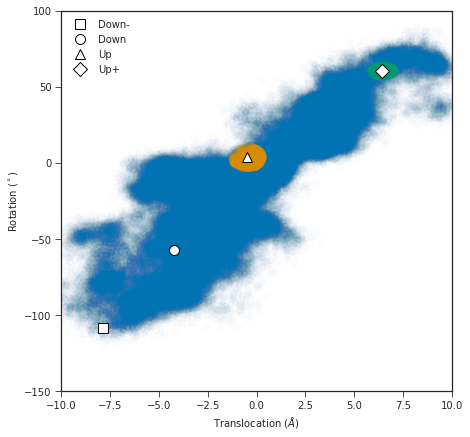

In [44]:
f = plt.figure(figsize=(7, 7))
ax = f.add_subplot(111)
ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], alpha=0.01)
ax.scatter(up_cvs[::5, 0], up_cvs[::5, 1], alpha=0.2)
ax.scatter(upp_cvs[::5, 0], upp_cvs[::5, 1], alpha=0.2)
util.format_cvs(ax, centroids=True)
ax.legend(["Down-", "Down", "Up", "Up+"])

#  Up+

**7.7.21**

In [10]:
centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")
feat2_models = np.load("../../data/models_centroids_feat2.npy")

In [11]:
centroids

array([[  -7.863, -108.573],
       [  -4.24 ,  -56.95 ],
       [  -0.506,    3.94 ],
       [   6.447,   60.713]])

## centroids 

In [41]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb1 = data_arr[:, 54]  # R4 - D129


# ellipse centered at (6.447, 60.713) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 6.447) / 0.632
rot_ax_upp = (rot - 60.713) / 4.0
upplus_ids = (
    ((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25) & (sb1 < 1.0)
).nonzero()[0]

In [42]:
len(upplus_ids)

6946

In [43]:
upp_cvs = cv_arr[upplus_ids]
upp_sbs = data_arr[upplus_ids]

In [25]:
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids_uu = [48, 54, 53, 59]

In [16]:
from itertools import combinations

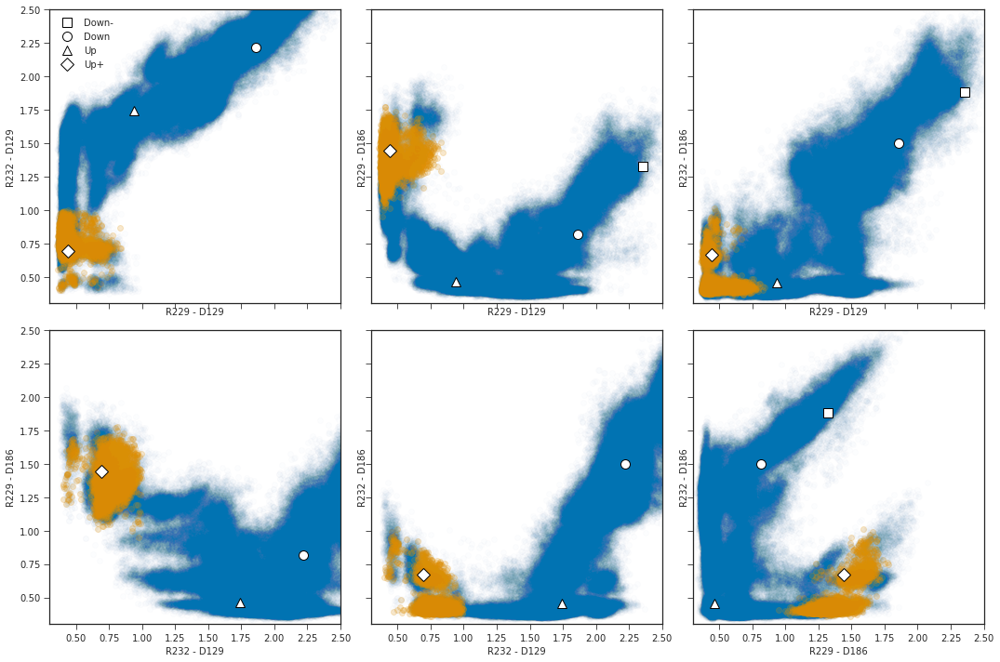

In [26]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(data_arr[::10, sb1], data_arr[::10, sb2], alpha=0.01)
    ax.scatter(upp_sbs[:, sb1], upp_sbs[:, sb2], alpha=0.2)
    ax.set(xlabel=f"{sb_labels[sb1 - 30]}", ylabel=f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.5], ylim=[0.3, 2.5])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.tight_layout()

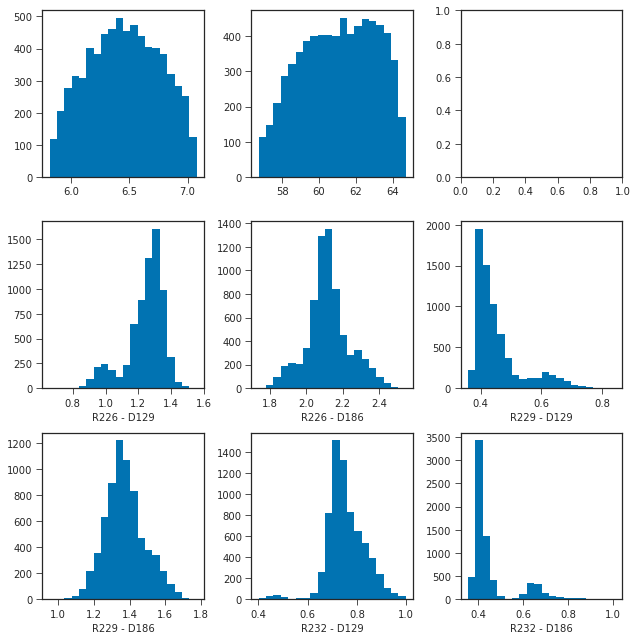

In [27]:
# histograms of CVs
f, axs = plt.subplots(3, 3, figsize=(9, 9))
axs[0][0].hist(upp_cvs[:, 0], bins=20)
axs[0][1].hist(upp_cvs[:, 1], bins=20)
# axs[0][2].hist(down_livac[:, 1], bins=20)
for i, (idx, ax) in enumerate(zip((42, 47, 48, 53, 54, 59), axs.flat[3:])):
    ax.hist(upp_sbs[:, idx], bins=20)
    ax.set_xlabel(f"{sb_labels[idx - 30]}")
f.tight_layout()

In [19]:
# large R232-D129 distance
ids = np.argsort(upp_sbs[:, 54])
for i in upplus_ids[ids[:-20:-1]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 54]}")

(139, 7221): 1.7942055463790894
(139, 6190): 1.7344874143600464
(139, 6373): 1.7302179336547852
(139, 6206): 1.7127653360366821
(139, 6186): 1.7074522972106934
(139, 7217): 1.6918447017669678
(139, 5974): 1.6867141723632812
(47, 6265): 1.6690782308578491
(139, 6188): 1.66054105758667
(139, 7220): 1.6590152978897095
(139, 4867): 1.6545706987380981
(139, 4873): 1.6502463817596436
(139, 6041): 1.6444166898727417
(47, 6297): 1.6390931606292725
(139, 6375): 1.6387239694595337
(139, 5025): 1.6304677724838257
(139, 6368): 1.6300039291381836
(139, 4106): 1.6290690898895264
(139, 5988): 1.6212904453277588


In [20]:
ids = np.argsort((upp_sbs[:, 54] - 1.4) ** 2)
for i in upplus_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 54]}")

(47, 7124): 1.40018892288208
(47, 7117): 1.4005517959594727
(139, 6541): 1.400569200515747
(47, 7123): 1.3961530923843384
(47, 5100): 1.3944636583328247
(139, 6710): 1.394370436668396
(139, 4138): 1.4086830615997314
(139, 6085): 1.3890408277511597
(139, 4758): 1.385936975479126
(47, 6027): 1.3846772909164429
(42, 6291): 1.3820233345031738
(47, 7118): 1.3817355632781982
(47, 7141): 1.4204329252243042
(139, 6722): 1.3789526224136353
(47, 7125): 1.4238702058792114
(139, 6039): 1.4253231287002563
(47, 6347): 1.4328371286392212
(47, 6028): 1.3656401634216309
(139, 6093): 1.4402354955673218
(42, 6369): 1.3571860790252686


In [21]:
ids = np.argsort((upp_sbs[:, 54] - 1) ** 2)
for i in upplus_ids[ids[:20]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 54]}")

(97, 627): 0.9982870817184448
(43, 1639): 1.0026191473007202
(44, 544): 1.0026555061340332
(97, 593): 0.9958041310310364
(144, 9677): 0.9924707412719727
(44, 433): 1.0080848932266235
(43, 1385): 1.008752703666687
(43, 1641): 0.9894781708717346
(97, 637): 1.011346697807312
(95, 2566): 0.9880901575088501
(43, 3884): 1.0123388767242432
(144, 8910): 0.9872943162918091
(139, 1545): 0.9871220588684082
(144, 3414): 0.985828161239624
(97, 615): 0.982069730758667
(97, 609): 0.9820234179496765
(97, 563): 0.9817882180213928
(97, 1799): 0.9815431833267212
(144, 3372): 0.9808838963508606
(139, 1544): 0.9807875752449036


**added cutoff for R4-D129 distance**

In [28]:
# R232-D186 distance, bimodal
ids = np.argsort((upp_sbs[:, 59] - 0.65) ** 2)
for i in upplus_ids[ids[:10]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 59]}")

(144, 4510): 0.6499315500259399
(147, 6098): 0.6498538851737976
(144, 2344): 0.6498083472251892
(144, 1224): 0.6497098803520203
(97, 7157): 0.6503084301948547
(97, 7978): 0.6503391861915588
(97, 7107): 0.6503707766532898
(147, 6560): 0.6503744721412659
(97, 6824): 0.6496068239212036
(97, 7272): 0.6495875716209412


In [29]:
# R232-D186 distance, bimodal
ids = np.argsort((upp_sbs[:, 59] - 0.38) ** 2)
for i in upplus_ids[ids[:10]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 59]}")

(48, 1441): 0.37999099493026733
(98, 5426): 0.37998032569885254
(97, 1701): 0.37990668416023254
(95, 2950): 0.3801131248474121
(95, 3310): 0.38015273213386536
(48, 9228): 0.3801591992378235
(147, 5857): 0.38016441464424133
(96, 615): 0.38017895817756653
(93, 5104): 0.37981709837913513
(147, 5342): 0.38023805618286133


In [30]:
# R232-D186 distance, bimodal
ids = np.argsort((upp_sbs[:, 59] - 0.53) ** 2)
for i in upplus_ids[ids[:10]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 59]}")

(88, 1201): 0.5294299125671387
(94, 2596): 0.532757043838501
(95, 1624): 0.5270608067512512
(95, 2670): 0.5259467363357544
(147, 5206): 0.524684727191925
(98, 2446): 0.5243900418281555
(95, 2895): 0.5360279679298401
(147, 5823): 0.5221053957939148
(95, 2569): 0.5204969048500061
(44, 1852): 0.5201249718666077


In [31]:
# minimum R229-D129 distance
ids = np.argsort(upp_sbs[:, 48] ** 2)
for i in upplus_ids[ids[:10]]:
    print(f"{util.anton_frame(i)}: {data_arr[i, 48]}")

(144, 1324): 0.35809770226478577
(98, 4800): 0.36530542373657227
(144, 132): 0.36573487520217896
(49, 2523): 0.366095632314682
(144, 346): 0.3661106526851654
(98, 278): 0.3662430942058563
(98, 240): 0.36738675832748413
(147, 4372): 0.36744117736816406
(48, 4222): 0.3679482936859131
(144, 4386): 0.36811548471450806
